#***`Trending YouTube Video Analysis..!`***


---



A vast analysis of various aspects in the world of YouTube, with detailed and informative plots, lots of fun insights and some magic of machine learning, trying to answer as many questions as possible.

What questions we posed ourselves?


1.   What are the most famous channels?
2.   What are the most liked videos?
3.   What are the most hated videos?
4. Which country has the most videos posted?
5. What are the top 10 videos in each category based on views?
6. How do views vary over the days of the week?(Weekend vs weekdays)	

and many more ....



---



> Language: Python


> Algorithms: Random forest, Decision Tree, XGB Boost Guassian and KNN classifiers




> Methods used: Classification, Ensemble Learning Methods.


> Predictions: Missing Categories of Videos













---







In [1]:
dir = "C:\\Users\\ravin\\Downloads\\YTNEW\\YT"
model_dir ="C:\\Users\\ravin\\Downloads\\YTNEW\\models"

##Importing Required Libraries

In [2]:
import os
import re
import csv
import sys
import json
import plotly
import pickle
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
from math import log10
from io import StringIO
from matplotlib import cm
import plotly.express as px 
import plotly.graph_objs as go 
import plotly.offline as pyoff
import matplotlib.pyplot as plt
from warnings import simplefilter
from IPython.core.display import HTML,display
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

C:\Users\ravin\AppData\Local\Temp\ipykernel_31976\3327491529.py:20: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [3]:
import xgboost
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import VotingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

In [4]:
%matplotlib inline
simplefilter(action='ignore', category=FutureWarning)
simplefilter(action='ignore', category=UserWarning)
simplefilter(action='ignore', category=RuntimeWarning)
init_notebook_mode(connected=True)

In [5]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')
from collections import Counter
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import RegexpTokenizer
from wordcloud import WordCloud, STOPWORDS
from nltk import sent_tokenize, word_tokenize
from nltk.sentiment import SentimentIntensityAnalyzer

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ravin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ravin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ravin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


A function which has the css styling for plots

In [6]:
def cssset():
  return display(HTML("""<style>
  #output-body {
    display: flex;
    align-items: center;
    justify-content: center;
    background-color:white;
    color:black;
    }
  .output_text pre{
    margin-right : 70px;
    color: black;
    font-weight: bold;
    /* font-size: 10px; */
  }

}  </style>"""))

'''This code defines a CSS style for the output display in a web page. 
It sets the background color to white and the text color to black. 
It also arranges the output content to be centered both vertically and horizontally within its container.
 Additionally, it adjusts the styling of text elements within the output, adding margin and making the text bold.'''

'This code defines a CSS style for the output display in a web page. \nIt sets the background color to white and the text color to black. \nIt also arranges the output content to be centered both vertically and horizontally within its container.\n Additionally, it adjusts the styling of text elements within the output, adding margin and making the text bold.'

#Data Exploration

##Data Processing

In [7]:
def dateprocessattributes(data):
  data["publishedAt"] = pd.to_datetime(data["publishedAt"])
  data["trending_date"] = pd.to_datetime(data["trending_date"],format="ISO8601")
  data["trend_year"]=data["trending_date"].apply(lambda time:time.year)
  data["trend_date"] = data["trending_date"].apply(lambda time: time.day)
  data["trend_month"]=data["trending_date"].apply(lambda time:time.month)
  data["publish_year"]=data["publishedAt"].apply(lambda time:time.year)
  data["publish_month"]=data["publishedAt"].apply(lambda time:time.month)
  data["publish_day"]=data["publishedAt"].apply(lambda time:time.day)
  data["publish_weekday"]=data["publishedAt"].apply(lambda time:time.dayofweek)
  data["publish_hour"]=data["publishedAt"].apply(lambda time:time.hour)
  return data

'''
This block of code is a function called `dateprocessattributes` that takes a DataFrame `data` as input and processes date-related attributes within it.
 It converts the "publish_time" and "trending_date" columns to datetime format, extracts various date components like year, month, day, and weekday, and adds them as new columns to the DataFrame.
 Finally, it returns the updated DataFrame.
'''

'\nThis block of code is a function called `dateprocessattributes` that takes a DataFrame `data` as input and processes date-related attributes within it.\n It converts the "publish_time" and "trending_date" columns to datetime format, extracts various date components like year, month, day, and weekday, and adds them as new columns to the DataFrame.\n Finally, it returns the updated DataFrame.\n'

In [8]:
def categoriesmatch(x,dictionary): #function to get the categories
    try:
        return dictionary[str(x)]
    except:
        return "Unknown"
'''
This code defines a function called `categoriesmatch` that takes two arguments: `x` and `dictionary`.
 It attempts to retrieve the value associated with the key `str(x)` from the `dictionary`. If successful, it returns the corresponding value (presumably a category). 
 If the key is not found or an error occurs, it returns "Unknown".
 Essentially, it's a lookup function that maps values to categories based on a provided dictionary.

'''

'\nThis code defines a function called `categoriesmatch` that takes two arguments: `x` and `dictionary`.\n It attempts to retrieve the value associated with the key `str(x)` from the `dictionary`. If successful, it returns the corresponding value (presumably a category). \n If the key is not found or an error occurs, it returns "Unknown".\n Essentially, it\'s a lookup function that maps values to categories based on a provided dictionary.\n\n'

##Data Cleaning

In [9]:
def data_cleaning(data):
  if data['description'].isnull().sum()>0:
    data['description'] = data['description'].replace(np.nan,"") #Replacing the NaN values in the "Description" column with an empty string
  data = data.sort_values('video_id').drop_duplicates(subset=['trending_date', 'title'], keep='last')
  data = data.drop(columns=["publishedAt","category_id"],axis=1)
  return data
'''
This block of code defines a function called `data_cleaning` which takes a DataFrame `data` as input. 

1. It first checks if there are any missing values in the 'description' column, and if so, replaces them with an empty string.
2. Then it sorts the DataFrame by the 'video_id' column and keeps only the last occurrence of each combination of 'trending_date' and 'title', effectively removing duplicate rows based on these columns.
3. Finally, it drops the 'publish_time' and 'category_id' columns from the DataFrame and returns the cleaned DataFrame.
'''

"\nThis block of code defines a function called `data_cleaning` which takes a DataFrame `data` as input. \n\n1. It first checks if there are any missing values in the 'description' column, and if so, replaces them with an empty string.\n2. Then it sorts the DataFrame by the 'video_id' column and keeps only the last occurrence of each combination of 'trending_date' and 'title', effectively removing duplicate rows based on these columns.\n3. Finally, it drops the 'publish_time' and 'category_id' columns from the DataFrame and returns the cleaned DataFrame.\n"

##Loading the datasets

In [10]:
def load_data(file_path): 
    filech=file_path
    codecountry = filech[0:2]
    path=os.path.join(dir,filech)
    dfinput=pd.read_csv(path,encoding='utf-8')
    title_dict={}
    pathjson=os.path.join(dir,(codecountry+str('_category_id.json')))
    dfinputjson=pd.read_json(pathjson)
    dfinput['region']=codecountry
    for dict_a in dfinputjson['items']:
        title_dict[dict_a['id']]=dict_a['snippet']['title'] 

    dfinput = dateprocessattributes(dfinput) #Calling the function to process the date columns.
    dfinput['category']=dfinput['category_id'].apply(categoriesmatch,args=(title_dict,))
    dfinput = data_cleaning(dfinput)
    return dfinput
'''
This code defines a function called `load_data` that loads data from a CSV file specified by `file_path`. It does the following:

1. Extracts the country code from the file path.
2. Reads the CSV file into a pandas DataFrame.
3. Reads a JSON file containing category information.
4. Adds a 'region' column to the DataFrame with the country code.
5. Processes date attributes in the DataFrame using a function called `dateprocessattributes`.
6. Matches category IDs in the DataFrame with corresponding category titles using a dictionary.
7. Performs data cleaning on the DataFrame using a function called `data_cleaning`.
8. Returns the cleaned DataFrame.

'''

"\nThis code defines a function called `load_data` that loads data from a CSV file specified by `file_path`. It does the following:\n\n1. Extracts the country code from the file path.\n2. Reads the CSV file into a pandas DataFrame.\n3. Reads a JSON file containing category information.\n4. Adds a 'region' column to the DataFrame with the country code.\n5. Processes date attributes in the DataFrame using a function called `dateprocessattributes`.\n6. Matches category IDs in the DataFrame with corresponding category titles using a dictionary.\n7. Performs data cleaning on the DataFrame using a function called `data_cleaning`.\n8. Returns the cleaned DataFrame.\n\n"

In [11]:
cssset()
list_con = []
dict_cons = {}
df_t = pd.DataFrame()
for dirname, _, filenames in os.walk(dir):
    print("................................")
    for paths in filenames:
        if paths.lower().endswith(".csv"):
          list_con.append(paths[0:2])
          x = load_data(paths)
          globals()[str(paths[0:2])] = x
          dict_cons[str(paths[0:2])]=x
          print("------Created",paths[0:2],"DataFrame------")
    print("Processed all available Datasets")
'''
This code block does the following:

1. Defines an empty list (`list_con`) to store file prefixes.
2. Defines an empty dictionary (`dict_cons`) to store DataFrames.
3. Creates an empty DataFrame (`df_t`) using pandas.
4. Iterates through files in a directory (`dir`) using `os.walk()`.
5. For each file:
   - Checks if the file has a `.csv` extension.
   - Appends the first two characters of the file name to `list_con`.
   - Loads the CSV data using a function called `load_data()`.
   - Creates a DataFrame using the loaded data.
   - Assigns the DataFrame to a variable with the prefix as its name using `globals()`.
   - Adds the DataFrame to `dict_cons`.
   - Prints a message indicating the creation of the DataFrame.
6. Prints a message indicating that all available datasets have been processed.
'''

................................


FileNotFoundError: File C:\Users\ravin\Downloads\YTNEW\YT\.__category_id.json does not exist

##Checking and filling the missing categories

In [ ]:
for i,j in dict_cons.items():
  print(i,j[j.category=="Unknown"].value_counts().sum())
  '''
  This code iterates through items in a dictionary called `dict_cons`. 
  For each item, it prints the count of values in the dictionary's value (assumed to be a DataFrame) where the category column equals "Unknown". 
  Essentially, it's counting how many values have an "Unknown" category for each key in `dict_cons`.
  '''

CA 74
DE 256
FR 114
GB 90
IN 103
US 0


In [ ]:
def get_unique_categ(data):
  x_cat = data['category'].unique()
  y_cat = list(x_cat)
  cdict = {}
  for i in range(0,len(y_cat)):
    cdict[i] = y_cat[i]
  return cdict,x_cat
'''
This code defines a function called `get_unique_categ` that takes a dataset (`data`) as input. It aims to extract unique categories from the dataset's 'category' column. 

Here's a breakdown:

1. `x_cat = data['category'].unique()`: Retrieves unique values from the 'category' column of the dataset and assigns them to `x_cat`.
2. `y_cat = list(x_cat)`: Converts the unique values to a list and assigns it to `y_cat`.
3. `cdict = {}`: Initializes an empty dictionary called `cdict`.
4. Loops through each unique category in `y_cat`:
   - `for i in range(0,len(y_cat)):`: Iterates over the indices of `y_cat`.
   - `cdict[i] = y_cat[i]`: Assigns each unique category to the dictionary `cdict` with its index as the key.
5. Returns a tuple containing the dictionary `cdict` and the unique categories `x_cat`.
In simple terms, this function takes a dataset, finds the unique categories in the 'category' column, and returns them as a dictionary with 
indices as keys and category names as values, along with the unique categories as a list.
'''

"\nThis code defines a function called `get_unique_categ` that takes a dataset (`data`) as input. It aims to extract unique categories from the dataset's 'category' column. \n\nHere's a breakdown:\n\n1. `x_cat = data['category'].unique()`: Retrieves unique values from the 'category' column of the dataset and assigns them to `x_cat`.\n2. `y_cat = list(x_cat)`: Converts the unique values to a list and assigns it to `y_cat`.\n3. `cdict = {}`: Initializes an empty dictionary called `cdict`.\n4. Loops through each unique category in `y_cat`:\n   - `for i in range(0,len(y_cat)):`: Iterates over the indices of `y_cat`.\n   - `cdict[i] = y_cat[i]`: Assigns each unique category to the dictionary `cdict` with its index as the key.\n5. Returns a tuple containing the dictionary `cdict` and the unique categories `x_cat`.\nIn simple terms, this function takes a dataset, finds the unique categories in the 'category' column, and returns them as a dictionary with \nindices as keys and category names as

In [ ]:
from tqdm import tqdm
def fill_categ_unknown():
  listttt = [] 
  condict={}
  for con,cdf in tqdm(dict_cons.items()):
    if con!="US":
      cvpath = os.path.join(model_dir,(con+'_vector.pkl'))
      empath = os.path.join(model_dir,(con+'_model.pkl'))
      vector = pickle.load(open(cvpath, 'rb'))
      model = pickle.load(open(empath, 'rb'))
      cata,_ = get_unique_categ(cdf)
      print("\n----------Filling in unknowns for",con,"----------\n")
      for index,row in cdf.iterrows():
        if row["category"]=="Unknown":
          t=row["title"]
          t=[t]
          txc = vector.transform(t)
          pred = model.predict(txc)
          pred = list(pred)[0]
          cdf.at[index,'category'] = cata[pred]
      listttt.append(cdf)
      cdf = cdf.drop(columns=['video_id','region'],axis=1)
      globals()[con]=cdf
      condict[con] = cdf
    else:
      listttt.append(cdf)
      cdf = cdf.drop(columns=['video_id','region'],axis=1)
      globals()[con]=cdf
      condict[con] = cdf
  print("\n----------filled all unknowns in category----------")
  return listttt,dict_cons
listttt,condict= fill_categ_unknown()
df_t = pd.concat(listttt,ignore_index=True)
tdf = df_t
tdf.name = "The 6 Countries"
print("................................")
print("tdf  is the cumulative DataFrame")
'''
This code defines a function called `fill_categ_unknown` that iterates over a dictionary of dataframes (`dict_cons`). 
For each dataframe, it checks if the country is not "US". 
If not, it loads a pre-trained model and vectorizer specific to that country, predicts categories for rows with "Unknown" category, updates them, and stores the modified dataframe. 
If the country is "US", it just stores the dataframe.
 Finally, it concatenates all modified dataframes into a single dataframe `tdf` and prints a message indicating completion.

'''

  0%|          | 0/6 [00:00<?, ?it/s]


----------Filling in unknowns for CA ----------



 17%|█▋        | 1/6 [00:04<00:21,  4.23s/it]


----------Filling in unknowns for DE ----------



 33%|███▎      | 2/6 [00:14<00:30,  7.64s/it]


----------Filling in unknowns for FR ----------



 50%|█████     | 3/6 [00:19<00:19,  6.60s/it]


----------Filling in unknowns for GB ----------



 67%|██████▋   | 4/6 [00:23<00:11,  5.51s/it]


----------Filling in unknowns for IN ----------



100%|██████████| 6/6 [00:27<00:00,  4.60s/it]


----------filled all unknowns in category----------
................................
tdf  is the cumulative DataFrame


'\nThis code defines a function called `fill_categ_unknown` that iterates over a dictionary of dataframes (`dict_cons`). \nFor each dataframe, it checks if the country is not "US". \nIf not, it loads a pre-trained model and vectorizer specific to that country, predicts categories for rows with "Unknown" category, updates them, and stores the modified dataframe. \nIf the country is "US", it just stores the dataframe.\n Finally, it concatenates all modified dataframes into a single dataframe `tdf` and prints a message indicating completion.\n\n'

In [ ]:
for i,j in condict.items():
  print(i,j[j.category=="Unknown"].value_counts().sum())
  '''
  This code iterates through items in a dictionary called `condict`. 
  For each item, it prints the count of values where the category is "Unknown" in the list `j`. 
  It seems to be tallying up how many values in each list within `condict` have the category "Unknown".
  '''

CA 0
DE 0
FR 0
GB 0
IN 0
US 0


##Select a Region


In [ ]:
try:
  print("Available Countries for analysis ->",list_con)
  print("\n")
  x=input(prompt="Choose one country for using it all through analysis or hit enter\n")
  x = x.upper()
  1/len(x)
  df = condict[x]
  df.name = x
  print("\nThe analysis will be done on",x,"and it is stored as -> df")
except:
  print("\nPlease don't forget to input required country")
'''
This code block prompts the user to select a country from a list (`list_con`) for analysis. 
It then converts the input to uppercase, assigns it to a variable `x`, and tries to access a corresponding DataFrame (`df`) from a dictionary (`condict`). 
If successful, it assigns the DataFrame to `df` and prints a confirmation message. 
If there's an error (like if the user didn't input a country), it prints a reminder message.

'''

Available Countries for analysis -> ['CA', 'DE', 'FR', 'GB', 'IN', 'US', 'CA', 'DE', 'FR', 'GB', 'IN']



The analysis will be done on IN and it is stored as -> df


"\nThis code block prompts the user to select a country from a list (`list_con`) for analysis. \nIt then converts the input to uppercase, assigns it to a variable `x`, and tries to access a corresponding DataFrame (`df`) from a dictionary (`condict`). \nIf successful, it assigns the DataFrame to `df` and prints a confirmation message. \nIf there's an error (like if the user didn't input a country), it prints a reminder message.\n\n"

#Analysis

###Helper Functions

In [ ]:
global countries  
countries = list(tdf.region.unique())

In [ ]:
def show_values_on_bars(axs, h_vv="v",*args):
    def show_on_single_plot(ax):
        if h_vv == "v":
            for p in ax.patches:
                  x = p.get_x() + p.get_width() / 2 
                  y = p.get_y() + p.get_height() /8
                  value = int(p.get_height())
                  ax.text(x, y, value, ha="center",rotation=90) 
        elif h_vv == "h":
            for p in ax.patches:
              if len(args)==0:
                x = p.get_x() + p.get_width() /2
                y = p.get_y() + p.get_height() /2
                value = int(p.get_width())
                ax.text(x, y, value, ha="left",va="center")
              else:
                x = p.get_x() + p.get_width() +0.4
                y = p.get_y() + p.get_height() /2
                value = int(p.get_width())
                ax.text(x, y, value, ha="left",va="center")
    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            show_on_single_plot(ax)
    else:
        show_on_single_plot(axs)
'''
This code defines a function called `show_values_on_bars` that adds numerical values on top of bar plots. 
It accepts two main parameters: `axs`, which represents the axis or axes of the plot, and `h_vv`, which specifies whether the bars are horizontal ("h") or vertical ("v"). 

The function iterates over each bar in the plot, calculates the position to display the value, extracts the height or width of the bar, converts it to an integer, and then places this value at the appropriate position on the plot. 
It supports both horizontal and vertical bar plots, and it allows for additional arguments to fine-tune the positioning of the text if necessary.
'''

'\nThis code defines a function called `show_values_on_bars` that adds numerical values on top of bar plots. \nIt accepts two main parameters: `axs`, which represents the axis or axes of the plot, and `h_vv`, which specifies whether the bars are horizontal ("h") or vertical ("v"). \n\nThe function iterates over each bar in the plot, calculates the position to display the value, extracts the height or width of the bar, converts it to an integer, and then places this value at the appropriate position on the plot. \nIt supports both horizontal and vertical bar plots, and it allows for additional arguments to fine-tune the positioning of the text if necessary.\n'

In [ ]:
months_choices = {}
global months_choices
for i in range(1,13):
    months_choices[i] = datetime.date(2008, i, 1).strftime('%B')
'''
This block of code creates a dictionary called `months_choices` where the keys represent the numbers 1 to 12 (for each month), 
and the values represent the names of the corresponding months in the year 2008. 
It uses Python's `datetime` module to get the name of each month by specifying the month number and formatting it to display the full month name (`'%B'`).

'''

"\nThis block of code creates a dictionary called `months_choices` where the keys represent the numbers 1 to 12 (for each month), \nand the values represent the names of the corresponding months in the year 2008. \nIt uses Python's `datetime` module to get the name of each month by specifying the month number and formatting it to display the full month name (`'%B'`).\n\n"

In [ ]:
dict_cat,x_cat=get_unique_categ(df)

##Correlation Analysis

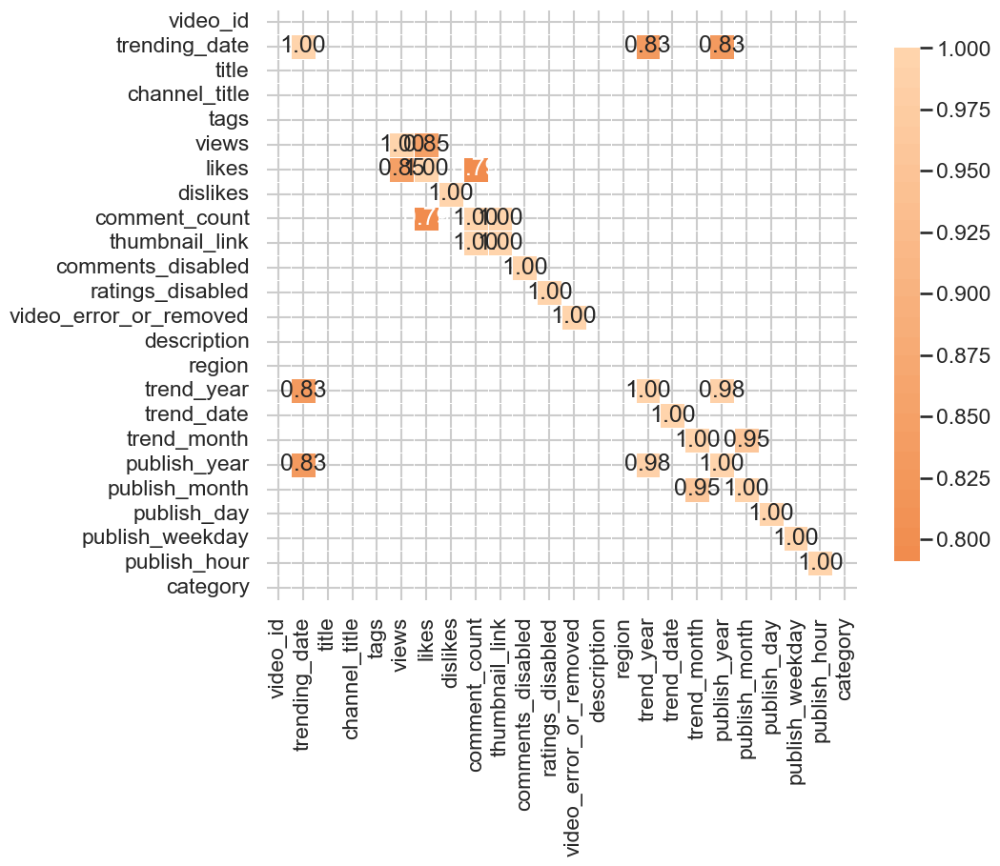

"\nThis code defines a function called `corrheatmap` that takes a pandas DataFrame `data` as input. It aims to visualize the correlations between numeric variables in the DataFrame. Here's a breakdown of what it does:\n\n1. Replaces any '#NAME?' values in the DataFrame with NaN (Not a Number).\n2. Converts the data to numeric format, coercing non-numeric values to NaN.\n3. Calculates the correlation matrix between the numeric columns.\n4. Filters the correlation matrix to only include correlations with an absolute value greater than or equal to 0.75.\n5. Plots a heatmap using Seaborn, visualizing the filtered correlation matrix.  \n6. Displays the heatmap using Matplotlib.\n\nThe resulting heatmap provides a graphical representation of how strongly variables in the DataFrame are correlated with each other. Strong correlations (both positive and negative) are highlighted, helping to identify patterns and relationships in the data.\n"

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def corrheatmap(data):
    # Replace '#NAME?' with NaN
    data.replace('#NAME?', np.nan, inplace=True)
    
    # Convert data to numeric
    data = data.apply(pd.to_numeric, errors='coerce')
    
    # Calculate correlations
    correlations = data.corr()
    correlations = correlations[((correlations >= 0.75) | (correlations <= -0.75))]
    
    # Plot heatmap
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True, cbar_kws={"shrink": .70})
    plt.show()

# Call the function with your DataFrame 'df'
corrheatmap(df)
'''
This code defines a function called `corrheatmap` that takes a pandas DataFrame `data` as input. It aims to visualize the correlations between numeric variables in the DataFrame. Here's a breakdown of what it does:

1. Replaces any '#NAME?' values in the DataFrame with NaN (Not a Number).
2. Converts the data to numeric format, coercing non-numeric values to NaN.
3. Calculates the correlation matrix between the numeric columns.
4. Filters the correlation matrix to only include correlations with an absolute value greater than or equal to 0.75.
5. Plots a heatmap using Seaborn, visualizing the filtered correlation matrix.  
6. Displays the heatmap using Matplotlib.

The resulting heatmap provides a graphical representation of how strongly variables in the DataFrame are correlated with each other. Strong correlations (both positive and negative) are highlighted, helping to identify patterns and relationships in the data.
'''

In [ ]:
l = ["views","likes","dislikes","comment_count","ratings_disabled","comments_disabled"]
corr = df[l].corr()
corr
'''
This block of code calculates the correlation matrix for selected columns in a DataFrame (df).
 It specifically looks at correlations between columns related to video statistics such as views, likes, dislikes, comment count, and boolean indicators for ratings and comments being disabled. 
 The resulting correlation matrix shows how these variables are related to each other, with values ranging from -1 to 1 indicating the strength and direction of the relationship.
'''

'\nThis block of code calculates the correlation matrix for selected columns in a DataFrame (df).\n It specifically looks at correlations between columns related to video statistics such as views, likes, dislikes, comment count, and boolean indicators for ratings and comments being disabled. \n The resulting correlation matrix shows how these variables are related to each other, with values ranging from -1 to 1 indicating the strength and direction of the relationship.\n'

So from the data its evident that (views,likes) are well correlated, and (likes,comment_count) are well correlated

In [ ]:
for x in corr.columns:
  for y in range(corr.shape[0]):
    if (corr[x][y] >= 0.75 and corr[x][y]<1):
      print((x,corr.columns[y])) 
'''
This code iterates through each column (`x`) in a DataFrame (`corr`). 
Then, for each column, it checks the correlation value (`corr[x][y]`) with every other column (`y`). If the correlation value is greater than or equal to 0.75 but less than 1, it prints a tuple containing the names of the two columns and their correlation value. 
Essentially, it identifies pairs of columns that have a strong positive correlation but are not perfectly correlated (since it excludes correlations equal to 1).

'''

('views', 'likes')
('likes', 'views')
('likes', 'comment_count')
('comment_count', 'likes')


'\nThis code iterates through each column (`x`) in a DataFrame (`corr`). \nThen, for each column, it checks the correlation value (`corr[x][y]`) with every other column (`y`). If the correlation value is greater than or equal to 0.75 but less than 1, it prints a tuple containing the names of the two columns and their correlation value. \nEssentially, it identifies pairs of columns that have a strong positive correlation but are not perfectly correlated (since it excludes correlations equal to 1).\n\n'

Plots showing the correlation
between likes,views,dislikes


'\nThis block of code defines a function called `plotcorrr` which creates a 2x2 grid of scatterplots to visualize the correlations between different variables \n(likes, views, comment count, and dislikes) in a DataFrame `df`.\n Each scatterplot shows the relationship between two of these variables. Finally, it prints a message indicating what the plots represent.\n'

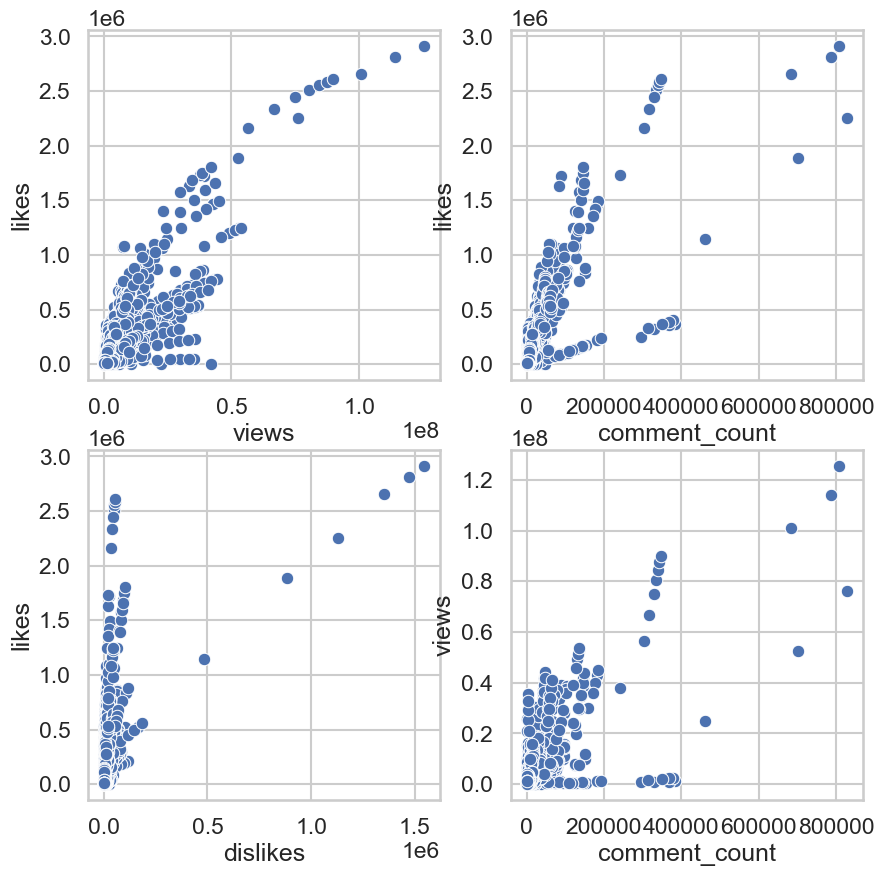

In [ ]:
cssset()
def plotcorrr(df):
    f,ax=plt.subplots(2,2,figsize=(10,10))
    sns.scatterplot(x='views',y='likes', data=df, ax=ax[0][0])
    sns.scatterplot(x='comment_count',y='likes', data=df, ax=ax[0][1])
    sns.scatterplot(x='dislikes',y='likes', data=df, ax=ax[1][0])
    sns.scatterplot(x='comment_count',y='views', data=df, ax=ax[1][1])
    print("Plots showing the correlation\nbetween likes,views,dislikes")
plotcorrr(IN)
'''
This block of code defines a function called `plotcorrr` which creates a 2x2 grid of scatterplots to visualize the correlations between different variables 
(likes, views, comment count, and dislikes) in a DataFrame `df`.
 Each scatterplot shows the relationship between two of these variables. Finally, it prints a message indicating what the plots represent.
'''

##EDA w.r.t to Time Series

publish_year
2018    23297
2017     9409
2024      141


'\nThis code defines a function `videosperyeartotal` that takes a DataFrame `data` containing information about videos and their publish years. \nIt then calculates the total number of videos published each year and either plots a scatter plot with annotations or a pie chart based on the number of unique years in the data. \nIf there are more than 6 unique years, it plots a scatter plot; otherwise, it plots a pie chart. Additionally, it prints the count of videos published each year.\n'

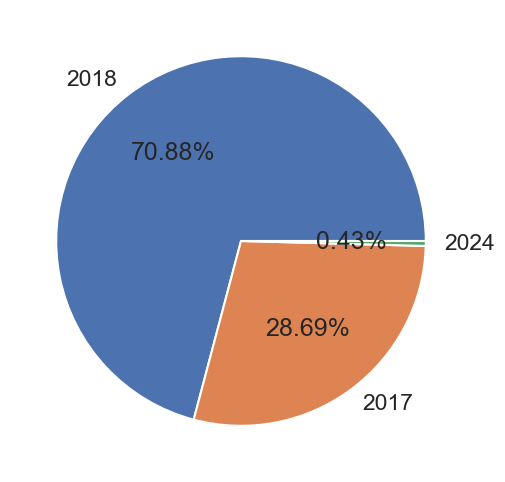

In [ ]:
cssset()
def videosperyeartotal(data):
  x = list(data.publish_year.unique())
  y = []
  for i in x:
    y.append(data[data.publish_year==i].value_counts().sum())
  if len(x)>6:
    fig, ax = plt.subplots()
    ax.scatter(x, y)
    for i, txt in enumerate(y):
      ax.annotate(txt, (x[i], y[i]), xytext=(10,10), textcoords='offset points')
      plt.scatter(x, y, marker='o', color='green')
  else:
    plt.pie(y,labels=x,autopct='%1.2f%%') 
  print(data["publish_year"].value_counts().to_string())
videosperyeartotal(df)
'''
This code defines a function `videosperyeartotal` that takes a DataFrame `data` containing information about videos and their publish years. 
It then calculates the total number of videos published each year and either plots a scatter plot with annotations or a pie chart based on the number of unique years in the data. 
If there are more than 6 unique years, it plots a scatter plot; otherwise, it plots a pie chart. Additionally, it prints the count of videos published each year.
'''

"\nThis code defines a function `statremov()` that generates pie charts to display statistics related to three attributes: \nvideo errors/removals, comments disabled, and ratings disabled, based on the unique values of these attributes in the input data.\n1. It first extracts the unique values of the 'comments_disabled' attribute from the input data.\n2. It then creates a list of legends corresponding to the three attributes.\n3. Next, it generates a list of counts for each unique value of the three attributes.\n4. It creates a figure with three subplots (one for each attribute) using `plt.subplots()`.\n5. Sets the title of the figure based on the input data's name.\n6. Sets the size of the figure to 20x8 inches.\n7. Defines colors for the pie charts.\n8. Iterates over each subplot:\n   - Generates a pie chart using `axi[col].pie()` with the counts and labels.\n   - Sets the title of each subplot with the corresponding legend.\n   - Increments the index to move to the next attribute's 

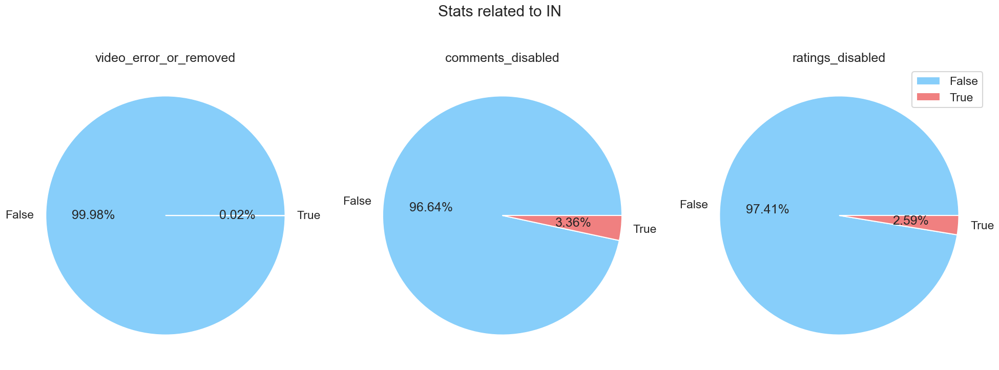

In [ ]:
cssset()
def statremov(data):
  al=data.comments_disabled.unique()
  leg = ['video_error_or_removed','comments_disabled','ratings_disabled']
  data=[list(data.video_error_or_removed.value_counts()),list(data.comments_disabled.value_counts()),list(data.ratings_disabled.value_counts())]
  f,axi = plt.subplots(nrows=1,ncols=3)
  f.suptitle("Stats related to %s" %(df.name))
  f.set_size_inches(20,8)
  colors = ['lightskyblue', 'lightcoral']
  i=0
  for row in range(1):
    for col in range(3):
      patches=axi[col].pie(data[i],labels=al,autopct='%1.2f%%',colors=colors)
      axi[col].set_title(f'{leg[i]}')
      i=i+1
  plt.legend(al, loc="best")
  plt.tight_layout()
statremov(df)
'''
This code defines a function `statremov()` that generates pie charts to display statistics related to three attributes: 
video errors/removals, comments disabled, and ratings disabled, based on the unique values of these attributes in the input data.
1. It first extracts the unique values of the 'comments_disabled' attribute from the input data.
2. It then creates a list of legends corresponding to the three attributes.
3. Next, it generates a list of counts for each unique value of the three attributes.
4. It creates a figure with three subplots (one for each attribute) using `plt.subplots()`.
5. Sets the title of the figure based on the input data's name.
6. Sets the size of the figure to 20x8 inches.
7. Defines colors for the pie charts.
8. Iterates over each subplot:
   - Generates a pie chart using `axi[col].pie()` with the counts and labels.
   - Sets the title of each subplot with the corresponding legend.
   - Increments the index to move to the next attribute's counts.
9. Adds a legend to the plot.
10. Adjusts the layout to ensure proper spacing.
11. Calls the `statremov()` function with the input data to visualize the statistics.

'''

"\nThis code defines a function called `timeplotperiod` that takes a DataFrame `data` and a list of variable names `var`. \nIt checks if the DataFrame has a 'trending_date' column and converts the specified variables to numeric values. \nThen, it calculates the mean of each variable grouped by the 'trending_date'. \nFinally, it plots the averages of these variables over time on a 2x2 grid of subplots, with each subplot representing a different variable.\n\n"

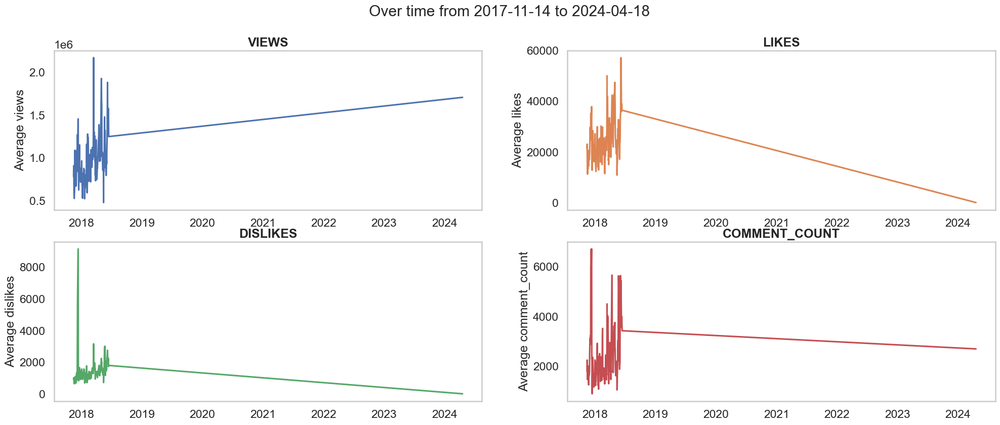

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

def timeplotperiod(data, var):
    # Check if 'trending_date' column exists in the DataFrame
    if 'trending_date' not in data.columns:
        raise KeyError("Column 'trending_date' not found in DataFrame")

    # Convert data to numeric and replace non-numeric values with NaN
    numericdataa = data[var].apply(pd.to_numeric, errors='coerce')
    
    # Calculate mean of numeric columns
    averages = numericdataa.groupby(data["trending_date"]).mean()
    
    # Plotting
    f, ax = plt.subplots(nrows=2, ncols=2)
    my_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    f.suptitle("Over time from {} to {}".format(min(data["trending_date"]).date(), max(data["trending_date"]).date()))
    f.set_size_inches(24, 9)
    i = 0
    for row in range(2):
        for col in range(2):
            ax[row, col].plot(averages.index.values, averages[var[i]], color=my_colors[i])
            ax[row, col].set_ylabel("Average {}".format(var[i]))
            ax[row, col].set_title("{}".format(var[i]).upper(), weight='bold')
            ax[row, col].grid(False)
            i += 1

# Call the function with your DataFrame 'df' and the variables to plot
timeplotperiod(df, ['views', 'likes', 'dislikes', 'comment_count'])
'''
This code defines a function called `timeplotperiod` that takes a DataFrame `data` and a list of variable names `var`. 
It checks if the DataFrame has a 'trending_date' column and converts the specified variables to numeric values. 
Then, it calculates the mean of each variable grouped by the 'trending_date'. 
Finally, it plots the averages of these variables over time on a 2x2 grid of subplots, with each subplot representing a different variable.

'''

"\nThis code defines a function called `analysismonths` that takes a DataFrame `data` as input.\n It sorts the DataFrame by the 'trend_month' column, counts the occurrences of each month, then creates a bar plot using seaborn to show the number of published videos for each month. \nFinally, it adds a title to the plot indicating the dataset's name and labels the axes.\n\n"

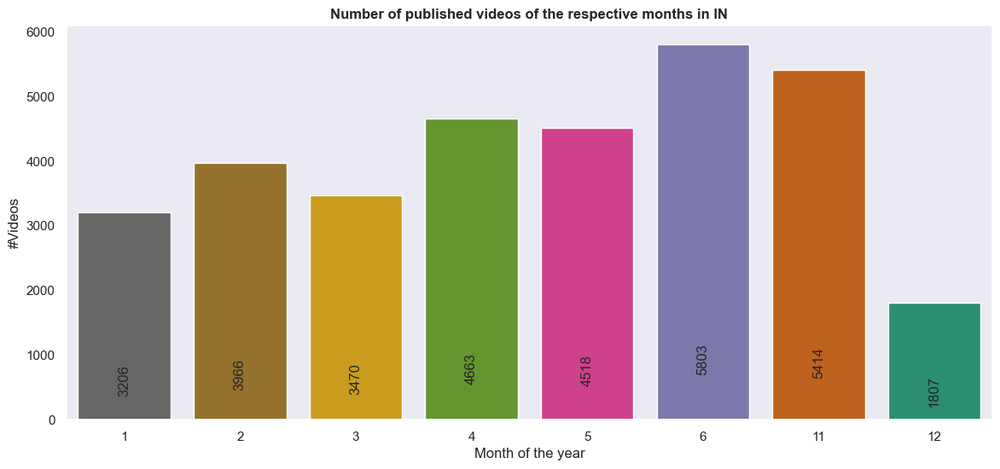

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def analysismonths(data):
    data2 = data.sort_values(by=['trend_month'])
    data2 = data2['trend_month'].value_counts()
    
    sns.set(rc={'figure.figsize':(14,6)})
    a = sns.barplot(x=data2.index, y=sorted(data2), palette='Dark2_r')
    a.grid(False)
    a.set_title('Number of published videos of the respective months in %s' %(data.name), weight='bold')
    a.set_xlabel("Month of the year")
    a.set_ylabel("#Videos")
    show_values_on_bars(a, 'v')

analysismonths(df)
'''
This code defines a function called `analysismonths` that takes a DataFrame `data` as input.
 It sorts the DataFrame by the 'trend_month' column, counts the occurrences of each month, then creates a bar plot using seaborn to show the number of published videos for each month. 
Finally, it adds a title to the plot indicating the dataset's name and labels the axes.

'''

"\nThis code defines a function `publishhourcountplot` that creates a line plot showing the number of videos published per hour of the day. \nIt uses Seaborn and Matplotlib libraries to plot the data. \nThe function takes a DataFrame `data` as input, which presumably contains information about video publishing times. \nIt then counts the number of videos published in each hour (`publish_hour` column), creates a line plot with markers, sets labels and title for the plot, and customizes the plot's appearance. \nFinally, it calls the function with a DataFrame `df`.\n"

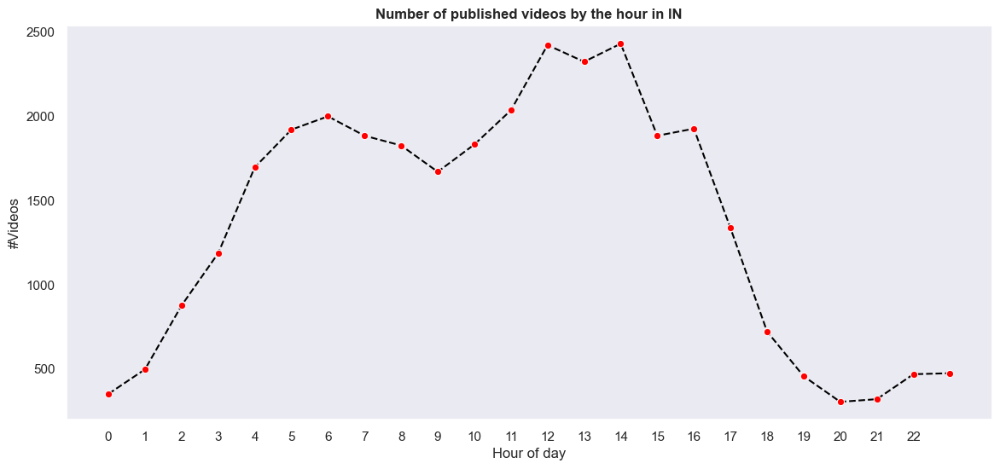

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def publishhourcountplot(data):
    by_hour = data.publish_hour.value_counts()
    
    sns.set(rc={'figure.figsize':(14,6)})
    a = np.arange(0, 23)
    ax = sns.lineplot(x=by_hour.index, y=by_hour.values, color='black', ls='--', marker='o', markerfacecolor='red')
    ax.grid(False)
    ax.set_xlabel("Hour of day")
    ax.set_ylabel("#Videos")
    ax.set_title("Number of published videos by the hour in %s" %(data.name), weight='bold')
    ax.set_xticks(a)

publishhourcountplot(df)
'''
This code defines a function `publishhourcountplot` that creates a line plot showing the number of videos published per hour of the day. 
It uses Seaborn and Matplotlib libraries to plot the data. 
The function takes a DataFrame `data` as input, which presumably contains information about video publishing times. 
It then counts the number of videos published in each hour (`publish_hour` column), creates a line plot with markers, sets labels and title for the plot, and customizes the plot's appearance. 
Finally, it calls the function with a DataFrame `df`.
'''

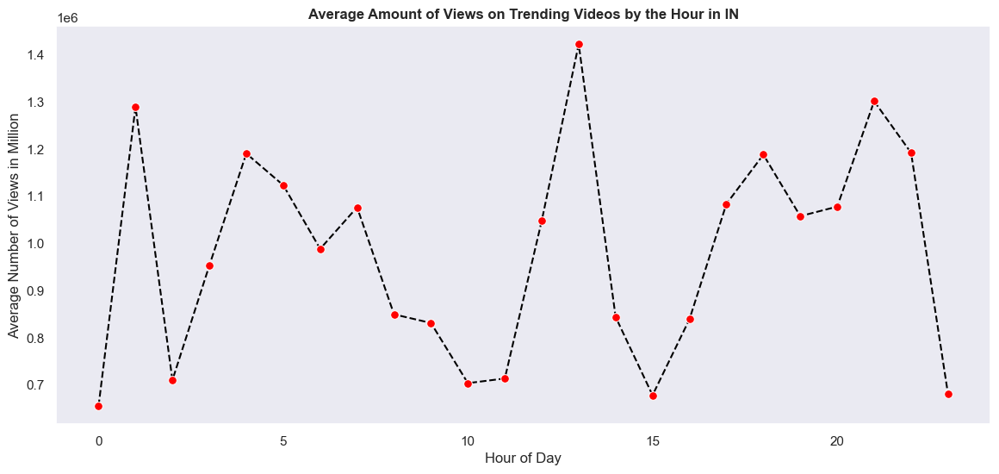

"\nThis code defines a function called `publishhourbiewsrplot` that takes a DataFrame `data` containing information about videos, including the hour they were published and the number of views they received. \nThe function cleans the data by converting the 'publish_hour' column to numeric, drops rows with missing values in the 'publish_hour' column, and then calculates the average number of views for each hour of the day. \nFinally, it plots a line graph showing the average number of views per hour, with markers highlighting each data point.\n\n"

In [ ]:
def publishhourbiewsrplot(data):
    # Convert 'publish_hour' to numeric if it's not already
    data['publish_hour'] = pd.to_numeric(data['publish_hour'], errors='coerce')
    
    # Drop rows with NaN values in 'publish_hour'
    data.dropna(subset=['publish_hour'], inplace=True)
    
    # Group by 'publish_hour' and calculate the mean of 'views'
    by_hour = data.groupby("publish_hour")["views"].mean()
    
    # Plotting
    sns.set(rc={'figure.figsize': (14, 6)})
    ax = sns.lineplot(x=by_hour.index, y=by_hour.values, ls='dashed', color='black', marker='o', markerfacecolor='red', markersize=7)
    ax.grid(False)
    ax.set_xlabel("Hour of Day")
    ax.set_ylabel("Average Number of Views in Million")
    ax.set_title("Average Amount of Views on Trending Videos by the Hour in %s" % (data.name), weight='bold')
    plt.show()

publishhourbiewsrplot(df)
'''
This code defines a function called `publishhourbiewsrplot` that takes a DataFrame `data` containing information about videos, including the hour they were published and the number of views they received. 
The function cleans the data by converting the 'publish_hour' column to numeric, drops rows with missing values in the 'publish_hour' column, and then calculates the average number of views for each hour of the day. 
Finally, it plots a line graph showing the average number of views per hour, with markers highlighting each data point.

'''

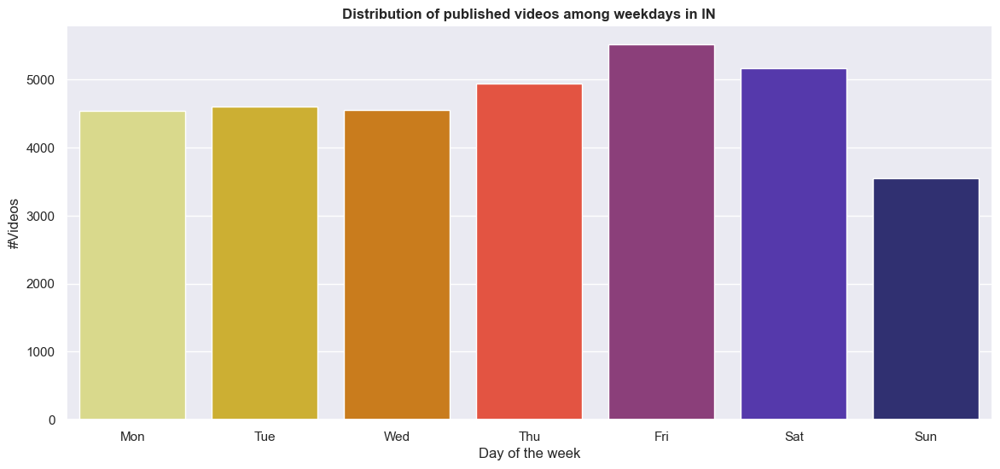

'\nThis code defines a function called `daypublishanalysis` that takes in a DataFrame `data`. \nInside the function, it creates a list of weekdays, counts the occurrences of each weekday in the DataFrame, and plots a bar graph showing the distribution of published videos among weekdays. \nThe x-axis represents the days of the week, the y-axis represents the number of videos published, and the graph is titled with the name of the DataFrame.\n'

In [ ]:


def daypublishanalysis(data):
    listweekss = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
    by_day = data['publish_weekday'].value_counts()  # Count occurrences of each weekday
    ax = sns.barplot(x=by_day.index, y=by_day.values, palette='CMRmap_r')  # Specify x and y explicitly
    ax.set_xticklabels(listweekss)  # Set custom labels for x-axis ticks
    plt.xlabel("Day of the week")
    plt.ylabel("#Videos")
    plt.title("Distribution of published videos among weekdays in %s" % (data.name), weight='bold')
    plt.show()

daypublishanalysis(df)
'''
This code defines a function called `daypublishanalysis` that takes in a DataFrame `data`. 
Inside the function, it creates a list of weekdays, counts the occurrences of each weekday in the DataFrame, and plots a bar graph showing the distribution of published videos among weekdays. 
The x-axis represents the days of the week, the y-axis represents the number of videos published, and the graph is titled with the name of the DataFrame.
'''

##Most of ?

Most VIEWED or LIKED or DISLIKED Video

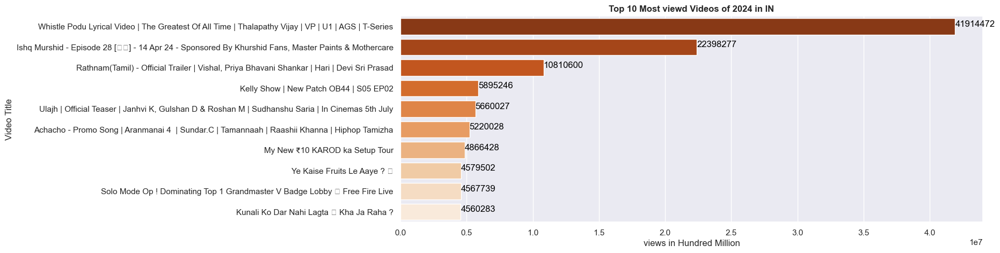

'\nThis code defines two functions for visualizing the top 10 videos based on views, likes, or dislikes. \nThe `mostlyyearvideos` function prompts the user to input a year (2017 or 2018) and a statistic choice (1 for views, 2 for likes, 3 for dislikes). \nIt then calls the `plotmostvideos` function to create a bar plot showing the top 10 videos based on the chosen criteria. The plots are created using seaborn and matplotlib libraries.\n\n'

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plotmostvideos(data, *args):
    nam = data.name
    colors = {'views': 'Oranges_r', 'likes': 'Greens_r', 'dislikes': 'Reds_r'}
    
    if args[1] == 1:
        y = 'views'
    elif args[1] == 2:
        y = 'likes'
    else:
        y = 'dislikes'
    
    if args[0] == None:
        data1 = data
        yr = "Combined 2017 & 2018"
    else:
        data1 = data[data['trend_year'] == args[0]]
        yr = str(args[0])
    
    data2 = data1[['title', y]].sort_values(by=y, ascending=True)
    data2.drop_duplicates("title", keep='last', inplace=True)
    data3 = data2.sort_values(by=y, ascending=False).head(10)
    
    sns.set(rc={'figure.figsize': (14, 5)})
    plot = sns.barplot(x=y, y='title', data=data3, palette=colors[y])
    
    for idx, value in enumerate(data3[y]):
        plot.text(value, idx, str(round(value, 2)), ha='left', color='black')
    
    plt.xlabel("%s in Hundred Million" % (y))
    plt.ylabel("Video Title")
    plt.title("Top 10 Most %sd Videos of %s in %s" % (y[:-1], yr, data.name), weight='bold')
    plt.show()

def mostlyyearvideos(*args):
    a = input(prompt="Enter the Year\n(2018 or 2017)\nor Just hit Enter")
    b = input(prompt="Choose stat\n1. Views\n2. Likes\n3. Dislikes")
    if len(args) > 0:
        x = tdf
    else:
        x = df
    if len(a) == 0:
        plotmostvideos(x, None, int(b))
    else:
        plotmostvideos(x, int(a), int(b))

mostlyyearvideos()
'''
This code defines two functions for visualizing the top 10 videos based on views, likes, or dislikes. 
The `mostlyyearvideos` function prompts the user to input a year (2017 or 2018) and a statistic choice (1 for views, 2 for likes, 3 for dislikes). 
It then calls the `plotmostvideos` function to create a bar plot showing the top 10 videos based on the chosen criteria. The plots are created using seaborn and matplotlib libraries.

'''

Most Liked,Viewed,Disliked videos from a particular Category

##EDA Related to Channels

                       0
0                  Music
1          Entertainment
2       Film & Animation
3        News & Politics
4                 Sports
5   Science & Technology
6         People & Blogs
7                 Comedy
8              Education
9                  Shows
10         Howto & Style
11                Gaming
12        Pets & Animals
13      Autos & Vehicles
14       Travel & Events
15                Movies


'\nThis code defines two functions: `catplotofmost` and `catmost`. \n\n1. `catplotofmost`: This function takes data, a category number, and a statistic number as inputs. \nIt then selects the corresponding category from the data and sorts the data based on the specified statistic (views, likes, or dislikes). \nIt extracts the top 10 rows based on the sorted statistic and creates a bar plot showing the top 10 most viewed, liked, or disliked videos in that category.\n\n2. `catmost`: This function interacts with the user by displaying a DataFrame of categories and prompting them to choose a category and a statistic. \nDepending on the input, it selects the appropriate dataset (either `tdf` or `df`). \nIf the dataset is empty, it prompts the user to choose a country and selects the data for that country. \nThen it calls the `catplotofmost` function with the chosen category, statistic, and dataset.\n\n\n\n'

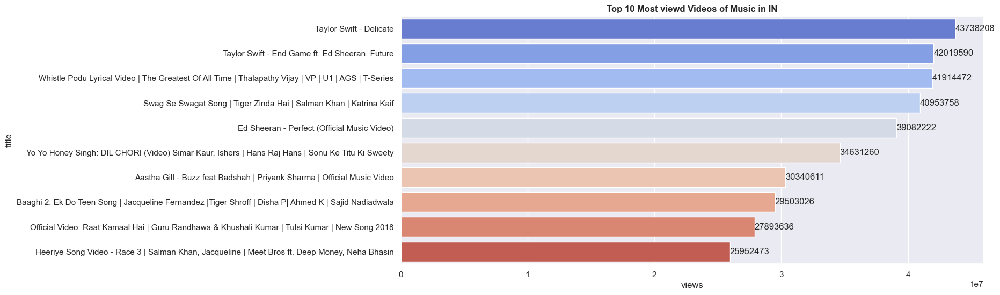

In [ ]:
def catplotofmost(data, catno, stat):
    categ = dict_cat[catno]
    if stat == 1:
        y = 'views'
    elif stat == 2:
        y = 'likes'
    else:
        y = 'dislikes'
    
    colors = {'views': 'coolwarm', 'likes': 'RdYlGn_r', 'dislikes': 'YlOrRd_r'}
    
    data1 = data[data['category'] == categ]
    data2 = data1[['title', y]].sort_values(by=y, ascending=True)
    data2.drop_duplicates("title", keep='last', inplace=True)
    data3 = data2.sort_values(by=y, ascending=False).head(10)
    
    sns.set(rc={'figure.figsize': (14, 6)})
    plot = sns.barplot(x=y, y='title', data=data3, palette=colors[y])
    plt.title("Top 10 Most %sd Videos of %s in %s" % (y[:-1], categ, data.name), weight='bold')
    show_values_on_bars(plot, 'h', 'a')


def catmost(*args):
    print(pd.DataFrame(x_cat))
    a = int(input(prompt="#Choose a Category from above\n"))
    b = int(input(prompt="#Choose stat\n1. Views\n2. Likes\n3. Dislikes"))
    
    if len(args) > 0:
        x = tdf
    else:
        x = df
        
    if x.shape[0] != 0:
        catplotofmost(x, a, b)
    else:
        c = input("choose one of countries").upper()
        cdf = condict[c]
        cdf.name = c 
        catplotofmost(cdf, a, b)

catmost()
'''
This code defines two functions: `catplotofmost` and `catmost`. 

1. `catplotofmost`: This function takes data, a category number, and a statistic number as inputs. 
It then selects the corresponding category from the data and sorts the data based on the specified statistic (views, likes, or dislikes). 
It extracts the top 10 rows based on the sorted statistic and creates a bar plot showing the top 10 most viewed, liked, or disliked videos in that category.

2. `catmost`: This function interacts with the user by displaying a DataFrame of categories and prompting them to choose a category and a statistic. 
Depending on the input, it selects the appropriate dataset (either `tdf` or `df`). 
If the dataset is empty, it prompts the user to choose a country and selects the data for that country. 
Then it calls the `catplotofmost` function with the chosen category, statistic, and dataset.



'''

Top 10 most trended channels

"\nThis code defines a function `trenvidschnls` that takes a DataFrame (`data`) and an optional argument (`*args`) representing a year. \nIt then filters the DataFrame based on the specified year (if provided) and counts the occurrences of each channel title. \nAfter that, it creates a horizontal bar plot showing the top 10 channels with the most trending videos, using seaborn (`sns`) for visualization.\n Finally, it adds labels to the plot and a title indicating the dataset's name.\n\n"

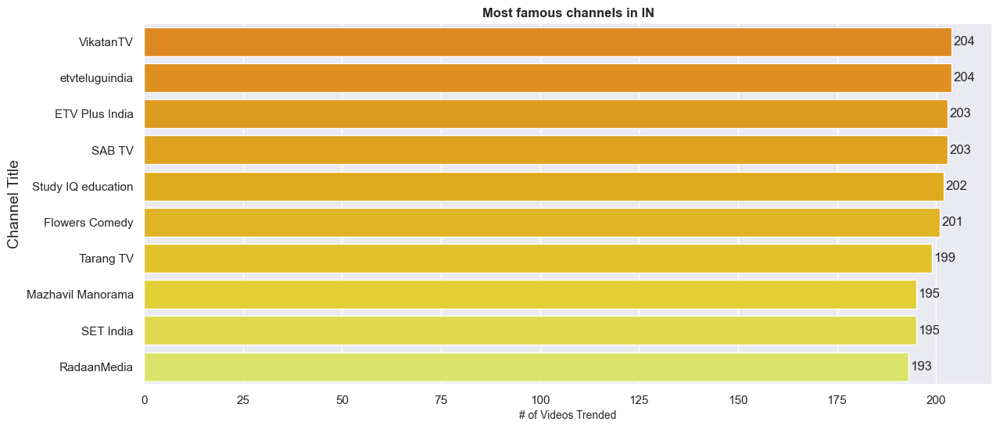

In [ ]:
def trenvidschnls(data, *args):
    nam = data.name
    if len(list(args)) == 0:
        pass
    else:
        data = data[data['trend_year'] == args[0]]
    
    x = data["channel_title"].value_counts()[:10] 
    sns.set(rc={'figure.figsize': (14, 6)})
    splot = sns.barplot(x=x.values, y=x.index.values, palette='Wistia_r')  # Fix: Specify x and y arguments
    show_values_on_bars(splot, "h", 0.3)
    plt.xlabel("# of Videos Trended", size=10)
    plt.ylabel("Channel Title", size=14)
    plt.title("Most famous channels in %s" % (nam), weight='bold')

trenvidschnls(df)
'''
This code defines a function `trenvidschnls` that takes a DataFrame (`data`) and an optional argument (`*args`) representing a year. 
It then filters the DataFrame based on the specified year (if provided) and counts the occurrences of each channel title. 
After that, it creates a horizontal bar plot showing the top 10 channels with the most trending videos, using seaborn (`sns`) for visualization.
 Finally, it adds labels to the plot and a title indicating the dataset's name.

'''

Function to gather channel_title and its data per video

In [ ]:
from collections import OrderedDict
def statchnlall(data):
  count = 0
  chnnldict=OrderedDict() # will contain data in order of Views->likes->dislikes->cmments
  chnl = data["channel_title"].unique()
  for chnl in chnl:
    chnnldict[chnl] = []
  for i in range(len(data["views"])):
    a = data["channel_title"].iloc[i]
    chnnldict[a].append([data["views"].loc[i],data["likes"].loc[i],data["dislikes"].loc[i],data["comment_count"].loc[i],data["title"].loc[i]])
  return chnnldict
chnl_data = statchnlall(IN.reset_index())
# chnl_data

Get the Statistics for the Given channels

In [ ]:
def channelstatsget(x,chnl_data):
  view=like=dislike=comment=maxv=maxl=indv=indl=0
  l = chnl_data[x]
  dict_a = {}
  tv = len(l)
  for i in range(len(l)):
    view = view + l[i][0]
    if (l[i][0]>maxv):
      indv = i
      maxv = l[i][0]
    like = like + l[i][1]
    if (l[i][1]>maxl):
      indl = i
      maxl = l[i][1]
    dislike = dislike + l[i][2]
    comment = comment + l[i][3]
  dict_a['total videos'] = [tv]
  dict_a['views'] = [view]
  dict_a['likes'] = [like]
  dict_a['dislikes'] = [dislike]
  dict_a['comment_count'] = [comment]
  dict_a['Avg Views per video'] = [int(view/tv)]
  dict_a['likes to dislikes ratio'] = [np.log2(int(like/dislike))]
  dict_a['MostViewed'] = [l[indv][4]]
  dict_a['MostLiked'] = [l[indl][4]]
  return pd.DataFrame(dict_a,index=[x])
'''
This code defines a function `statchnlall` that takes in a dataset `data` and returns a dictionary `chnnldict`. 
This dictionary contains information about YouTube channels, organized by channel title. 
For each channel, it stores a list of lists, where each inner list contains data about a specific video, including views, likes, dislikes, comments, and title. 
The function ensures the order of data is maintained using an OrderedDict. Finally, it returns this dictionary.

'''

'\nThis code defines a function `statchnlall` that takes in a dataset `data` and returns a dictionary `chnnldict`. \nThis dictionary contains information about YouTube channels, organized by channel title. \nFor each channel, it stores a list of lists, where each inner list contains data about a specific video, including views, likes, dislikes, comments, and title. \nThe function ensures the order of data is maintained using an OrderedDict. Finally, it returns this dictionary.\n\n'

In [ ]:
def drawchnlplotts(x):
  color=['Reds_r', 'Purples_r','Greens_r','Oranges_r']
  f, axes = plt.subplots(1, 4)
  sns.despine(left=True)
  f.set_size_inches(20,8)
  a = sns.barplot('channel','views',data=x,palette=color[1],ax=axes[0])
  axes[0].set_xticklabels(labels=x['channel'], rotation=90,weight='bold')
  axes[0].set_title('VIEWS',weight='bold')
  axes[0].set_ylabel('Views[In Hundred million]',weight='bold')
  show_values_on_bars(a,'v')
  b=sns.barplot('channel','likes',data=x,palette=color[2],ax=axes[1])
  axes[1].set_title('LIKES',weight='bold')
  axes[1].set_xticklabels(labels=x['channel'], rotation=90,weight='bold')
  axes[1].set_ylabel('Likes[In Ten million]',weight='bold')
  show_values_on_bars(b,'v')
  splot = sns.barplot('channel','dislikes',data=x,palette=color[0],ax=axes[2])
  axes[2].set_xticklabels(labels=x['channel'], rotation=90,weight='bold')
  axes[2].set_title('DISLIKES',weight='bold')
  axes[2].set_ylabel('Dislikes',weight='bold')
  show_values_on_bars(splot,'v')
  splot1 = sns.barplot('channel','Avg Views per video',data=x,palette=color[3],ax=axes[3])
  axes[3].set_xticklabels(labels=x['channel'], rotation=90,weight='bold')
  axes[3].set_title('AVG VIEWS',weight='bold')
  axes[3].set_ylabel('Avg Views [In Million]',weight='bold')
  show_values_on_bars(splot1,'v')
  f.tight_layout()

  '''
  This block of code defines a function called `drawchnlplotts` which takes a pandas DataFrame `x` as input.
    The function creates a figure with four subplots, each showing different aspects of YouTube channel data: views, likes, dislikes, and average views per video. 
    It uses seaborn's `barplot` function to plot the data, customizing the appearance of the plots such as color, labels, and titles. 
  Additionally, it calls a function `show_values_on_bars` to display the numeric values on top of each bar in the plots. 
  Finally, it adjusts the layout of the subplots for better visualization.
  
  '''

In [ ]:
def statcomparechnls(*args):
    df_cc = pd.DataFrame()
    df_cc = channelstatsget(args[0], chnl_data)
    for i in range(1, len(args)):
        df_cc = pd.concat([df_cc, channelstatsget(args[i], chnl_data)])  # Fix: Use pd.concat to concatenate DataFrames
    x = df_cc
    x['channel'] = x.index
    drawchnlplotts(x)
    return x.drop(columns='channel', axis=1)
    
'''
This code defines a function called `statcomparechnls` that takes multiple arguments representing channel names. 
It then retrieves statistics for each channel from a dataset called `chnl_data`, combines them into a single DataFrame, creates plots for each channel, and returns the combined statistics excluding the 'channel' column.

'''

"\nThis code defines a function called `statcomparechnls` that takes multiple arguments representing channel names. \nIt then retrieves statistics for each channel from a dataset called `chnl_data`, combines them into a single DataFrame, creates plots for each channel, and returns the combined statistics excluding the 'channel' column.\n\n"

##EDA On Category attribute

-------------- Science & Technology ----------------
channel_title
Technical Guruji           186
Geekyranjit                 68
Sharmaji Technical          68
Marques Brownlee            59
TAMIL TECH - தமிழ் டெக்     14


-------------- Gaming ----------------
channel_title
Clash of Clans       24
Clash Royale         17
PewDiePie             7
Talking Tom           4
All India Bakchod     3


-------------- Comedy ----------------
channel_title
ETV Plus India    203
FilterCopy        140
Be YouNick        112
TeluguOne         109
Aashqeen           96


-------------- Entertainment ----------------
channel_title
etvteluguindia       204
Flowers Comedy       201
SAB TV               200
Tarang TV            199
Mazhavil Manorama    195




'\nThis code defines a function called `chnltopcat` that takes in a DataFrame (`data`) and one or more categories as arguments. \nIt then filters the DataFrame based on the specified year (if provided), extracts the top 5 channel titles for each category, and visualizes them using bar plots.\n If only one category is provided, it plots a single bar plot; otherwise, it plots multiple bar plots in a subplot grid, one for each category. \nThe function utilizes seaborn for plotting and includes some customizations like color palettes and showing values on bars.'

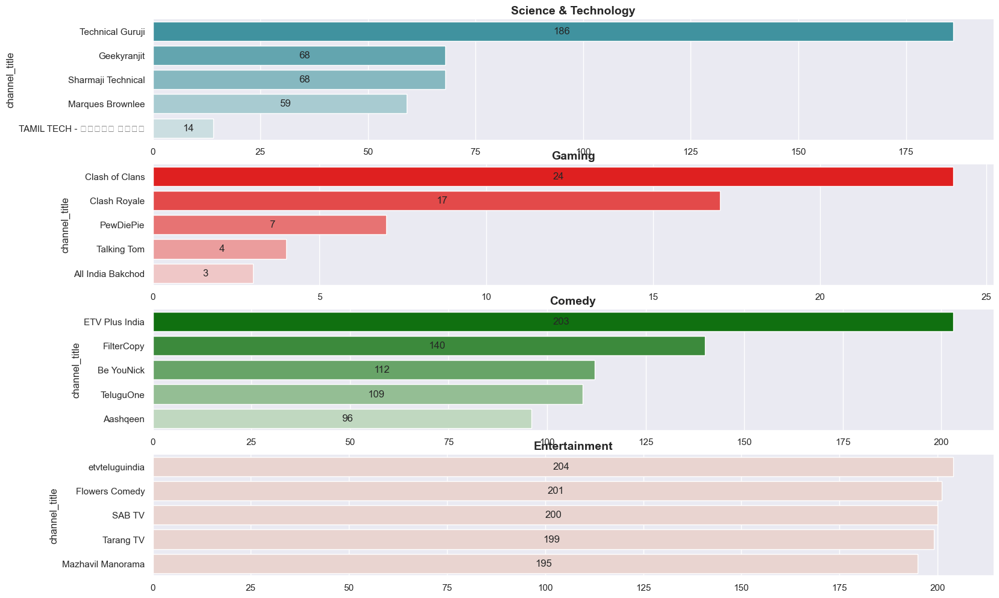

In [ ]:
def chnltopcat(data, *args, year=None):
    color = [
        sns.light_palette((210, 90, 60), input="husl", reverse=True),
        sns.light_palette("red", reverse=True),
        sns.light_palette("green", reverse=True),
        sns.cubehelix_palette(1, reverse=True),
        'Purples_r',
        'Greys_r',
        'Yellows_r'
    ]
    if year is not None:
        data2 = data[data['trend_year'] == year]
    else:
        data2 = data
    if len(args) == 1:
        catd = data2[data2['category'] == args[0]]
        catd = catd['channel_title'].value_counts()[:5]
        print('....{}....'.format(args[0]))
        print(catd.to_string())
        print("\n")
        sns.despine(left=True)
        a = sns.barplot(x=catd.values, y=catd.index, palette=color[0])  # Fix: Use x and y instead of positional arguments
        a.set_title(args[0], weight='bold', size=14)
        show_values_on_bars(a, 'h')
    else:
        f, ax = plt.subplots(len(args), 1, figsize=(18, len(args) * 3))
        for i in range(len(args)):
            catd = data2[data2['category'] == args[i]]
            catd = catd['channel_title'].value_counts()[:5]
            print('--------------', args[i], '----------------')
            print(catd.to_string())
            print("\n")
            sns.set_style("whitegrid")
            sns.despine(left=True)
            a = sns.barplot(x=catd.values, y=catd.index, ax=ax[i], palette=color[i])  # Fix: Use x and y instead of positional arguments
            ax[i].set_title(args[i], weight='bold', size=14)
            show_values_on_bars(a, 'h')

chnltopcat(df,'Science & Technology','Gaming','Comedy','Entertainment')
'''
This code defines a function called `chnltopcat` that takes in a DataFrame (`data`) and one or more categories as arguments. 
It then filters the DataFrame based on the specified year (if provided), extracts the top 5 channel titles for each category, and visualizes them using bar plots.
 If only one category is provided, it plots a single bar plot; otherwise, it plots multiple bar plots in a subplot grid, one for each category. 
The function utilizes seaborn for plotting and includes some customizations like color palettes and showing values on bars.'''


"\nThis code defines a function `famcatmost` that takes a DataFrame `data` as input. \nIt extracts the name of the DataFrame and creates a new DataFrame `catdf` that counts the occurrences of each category in the 'category' column of the input DataFrame. \nThen, it creates a horizontal bar plot using seaborn library, showing the count of trended videos in each category. \nThe function also adds values on the bars and sets the title, ylabel, and xlabel of the plot based on the name of the DataFrame. Finally, it calls the function with a DataFrame `df`.\n\n"

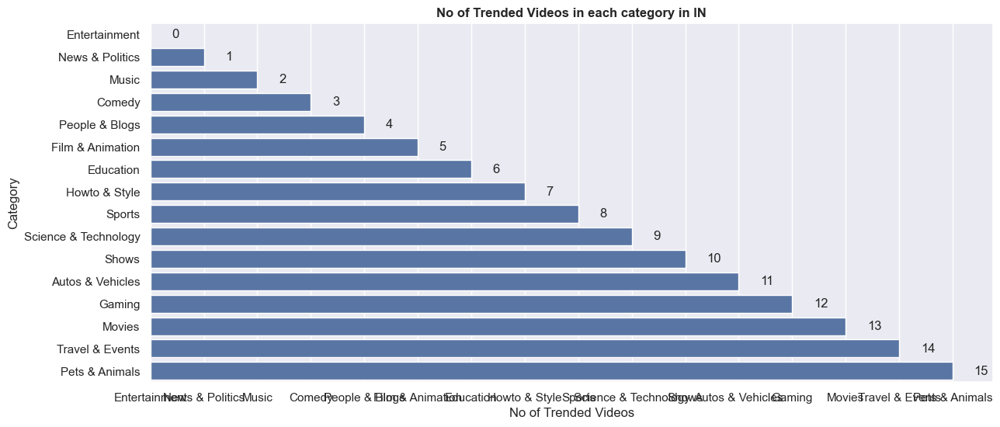

In [ ]:
def famcatmost(data):
    nam = data.name
    catdf = data['category'].value_counts().reset_index()
    sns.set_style("darkgrid")
    ax = sns.barplot(y=catdf['category'], x=catdf['category'], data=catdf, orient='h')
    show_values_on_bars(ax, 'h', 'a')
    ax.set_title("No of Trended Videos in each category in %s" % (nam), weight='bold')
    ax.set_ylabel('Category')
    ax.set_xlabel('No of Trended Videos')
famcatmost(df)
'''
This code defines a function `famcatmost` that takes a DataFrame `data` as input. 
It extracts the name of the DataFrame and creates a new DataFrame `catdf` that counts the occurrences of each category in the 'category' column of the input DataFrame. 
Then, it creates a horizontal bar plot using seaborn library, showing the count of trended videos in each category. 
The function also adds values on the bars and sets the title, ylabel, and xlabel of the plot based on the name of the DataFrame. Finally, it calls the function with a DataFrame `df`.

'''

In [ ]:
def pieplot(cata,yr):
  labelstype = cata.sort_values().index 
  values=cata.sort_values().values
  plt.figure(1, figsize=(20,10)) 
  plt.title("Distribution of Categories in year %d" %(yr),weight='bold')
  type_show_ids = plt.pie(cata, labels=labelstype,autopct=lambda p:f' {p*sum(values)/100 :.0f}', shadow=False,textprops={'fontsize': 14})
  plt.show()

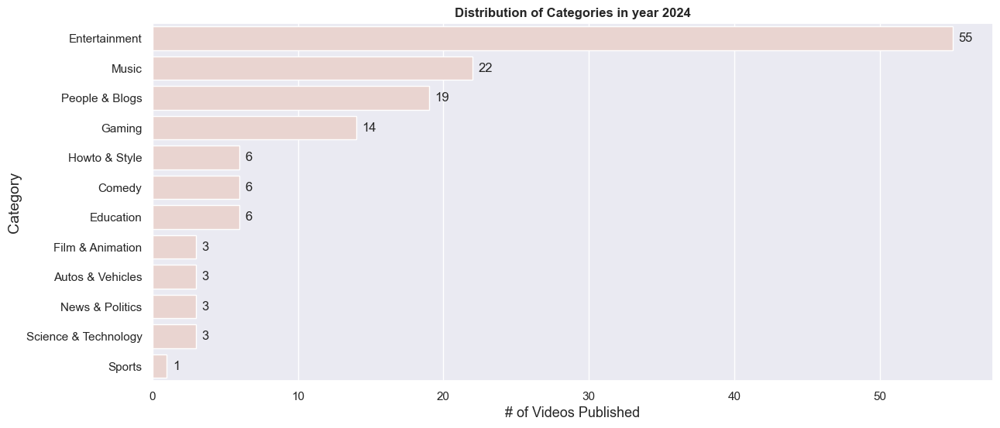

'\nThis code defines a function called `pieplot` that takes two arguments: `cata` (a pandas Series representing categories) and `yr` (an integer representing a year). \n\nInside the function:\n1. It sorts the categories and their corresponding values.\n2. It creates a pie chart with the sorted categories as labels and their corresponding values as slices.\n3. It sets the title of the pie chart to indicate the year.\n4. It displays the pie chart.\n\nSo basically, this function generates a pie chart showing the distribution of categories in a given year.\n\n'

In [ ]:
def publishcatego(data, yr):
    data_y = data[data['publish_year'] == yr]
    x = data_y["category"].value_counts() 
    if len(x) > 6:
        sns.set(rc={'figure.figsize':(14,6)})
        splot = sns.barplot(x=x.values, y=x.index.values, palette=sns.cubehelix_palette(1, reverse=True))
        show_values_on_bars(splot, "h", 0.2)
        plt.xlabel("# of Videos Published", size=13)
        plt.ylabel("Category", size=14)
        plt.title("Distribution of Categories in year %d" % (yr), weight='bold')
        plt.show()
    else:
        pieplot(x, yr)

#print(a)
year = int(input(prompt="Year to check distribution:?\n"))
publishcatego(df, year)
'''
This code defines a function called `pieplot` that takes two arguments: `cata` (a pandas Series representing categories) and `yr` (an integer representing a year). 

Inside the function:
1. It sorts the categories and their corresponding values.
2. It creates a pie chart with the sorted categories as labels and their corresponding values as slices.
3. It sets the title of the pie chart to indicate the year.
4. It displays the pie chart.

So basically, this function generates a pie chart showing the distribution of categories in a given year.

'''

In [ ]:

def pie(cat,categ):
  labelstype = (cat.index).astype(str)
  labelstype=labelstype.to_list()
  dict_a={'1':'Monday','2':'Tuesday','3':'Wednesday','4':'Thursday','5':'Friday','6':'Saturday','0':'Sunday'}
  j=0
  for i in labelstype:
    if i in dict_a.keys():
      labelstype[j]=dict_a[i]
      j=j+1
  pd.Index(labelstype)
  values=cat.sort_values().values
  plt.figure(1, figsize=(20,10)) 
  type_show_ids = plt.pie(cat, labels=labelstype,autopct=lambda p:f' {p*sum(values)/100 :.0f}', shadow=False,textprops={'fontsize': 14})
  plt.title(categ)
  plt.show()
  '''
  This code defines a function called `pie` that creates a pie chart. 
  It takes two arguments: `cat`, which is a pandas Series containing data to be plotted, and `categ`, which is a string representing the title of the pie chart. 

The function converts the index of `cat` into a list of strings and maps numerical labels to corresponding weekdays. 
Then it sorts the data in `cat` and generates a pie chart using Matplotlib. The labels for each segment are the weekday names, and the percentages are displayed with a specific format. 
Finally, it displays the pie chart with the specified title.
  
  '''

Category: Music


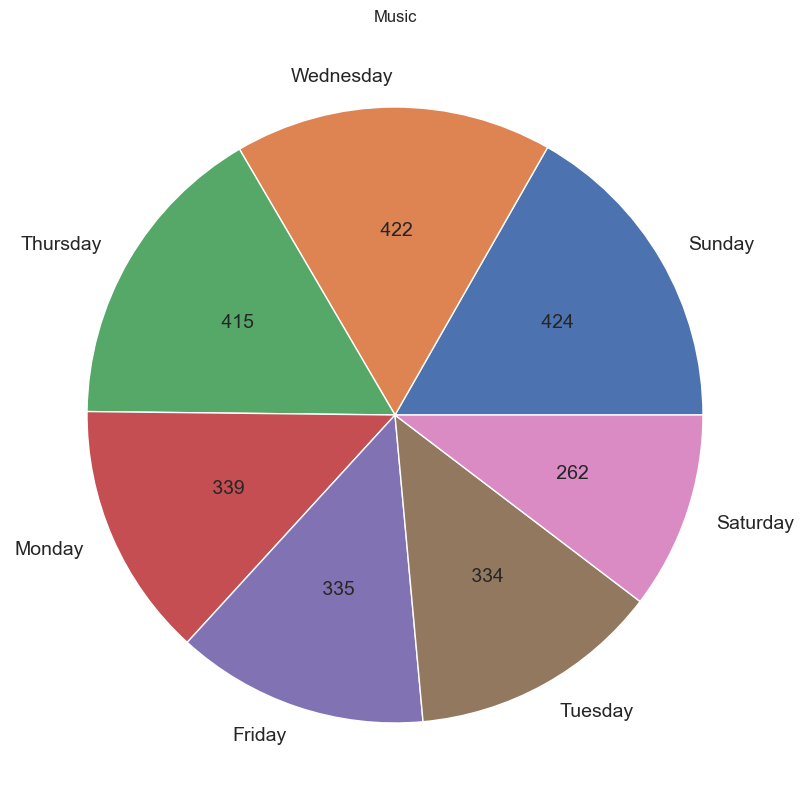

Category: Entertainment


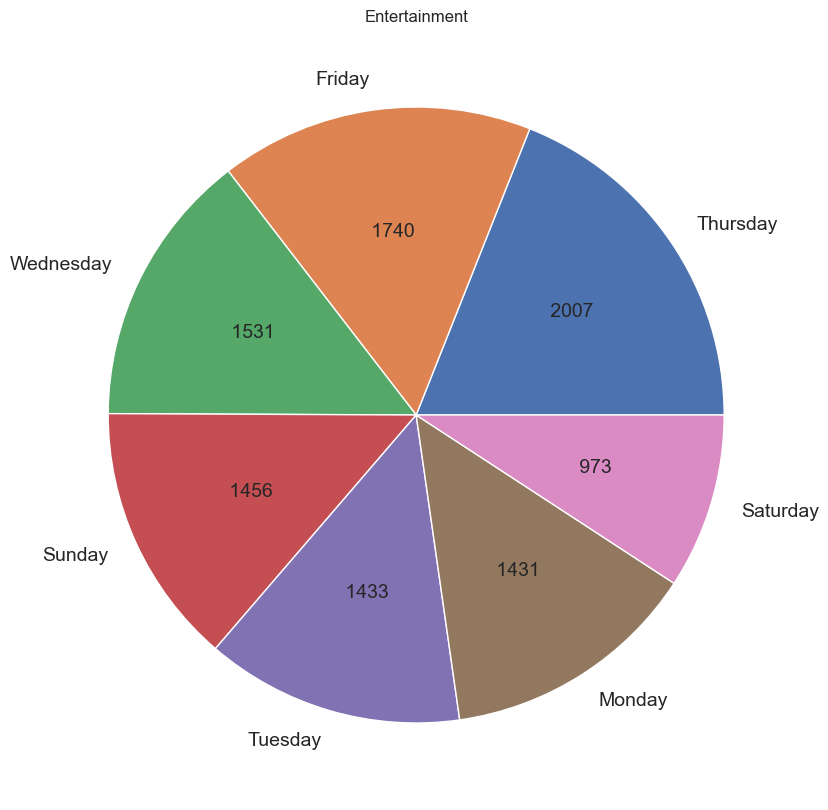

Category: Film & Animation


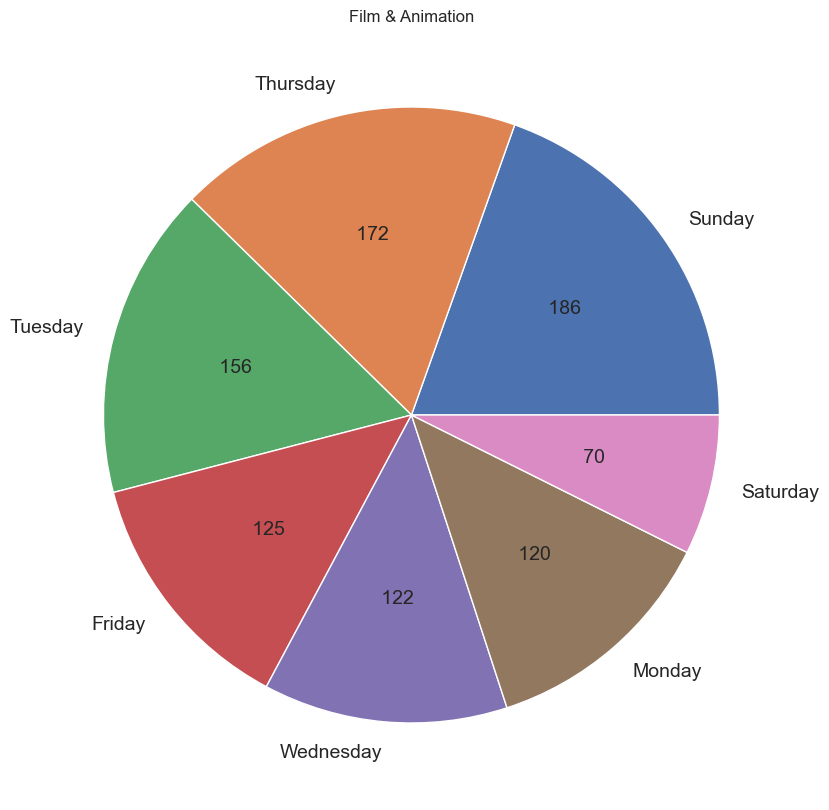

Category: News & Politics


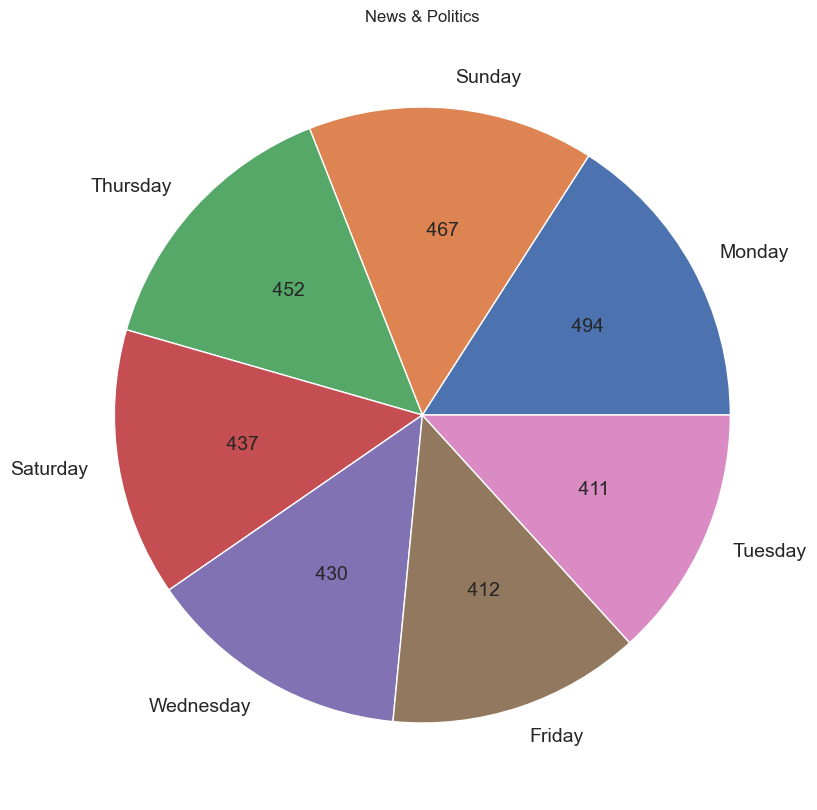

Category: Science & Technology


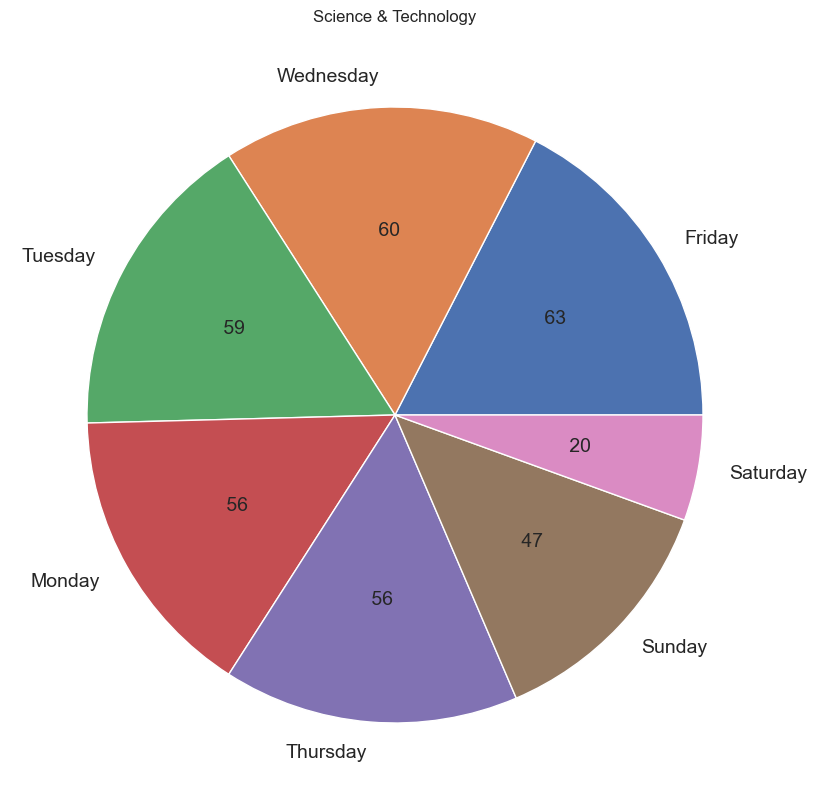

Category: People & Blogs


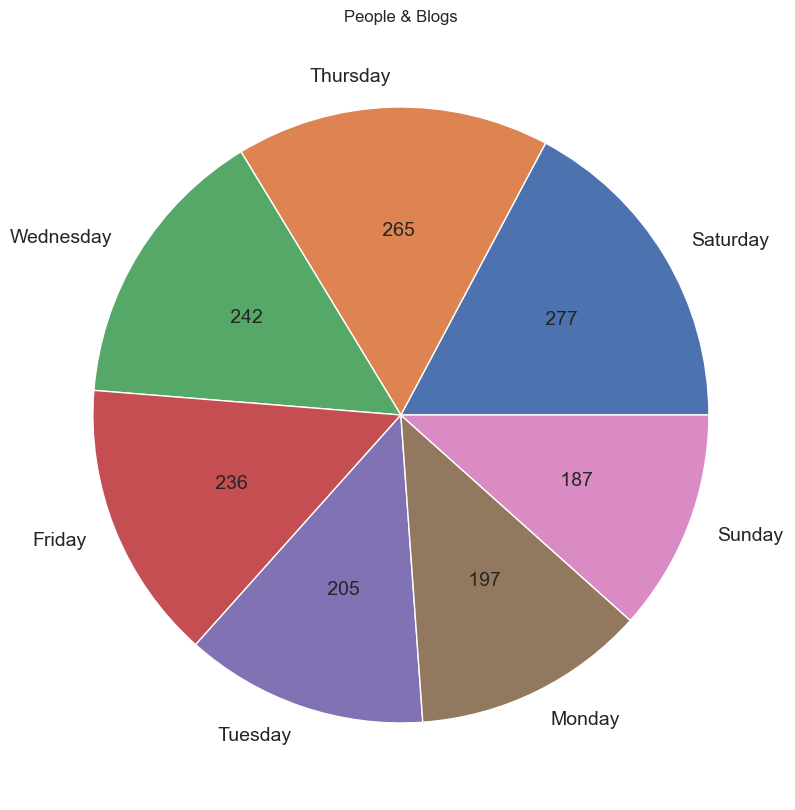

Category: Comedy


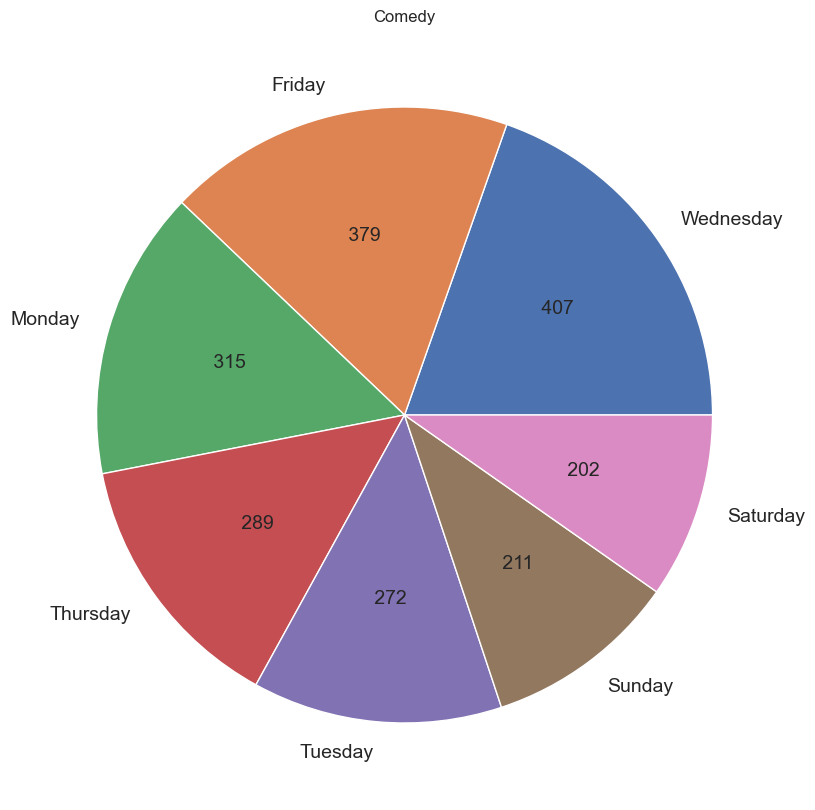

Category: Education


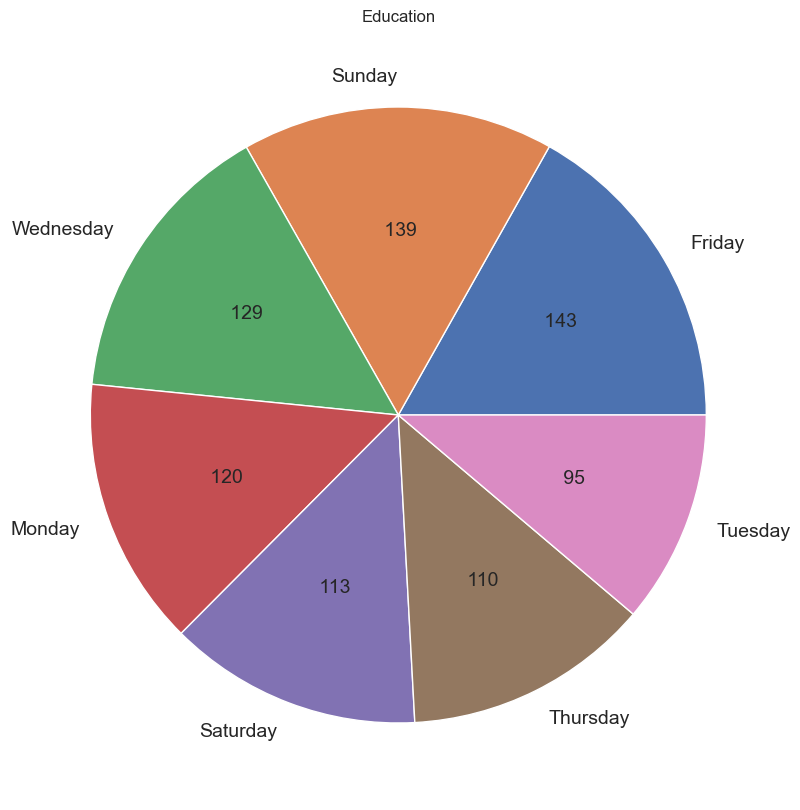

Category: Sports


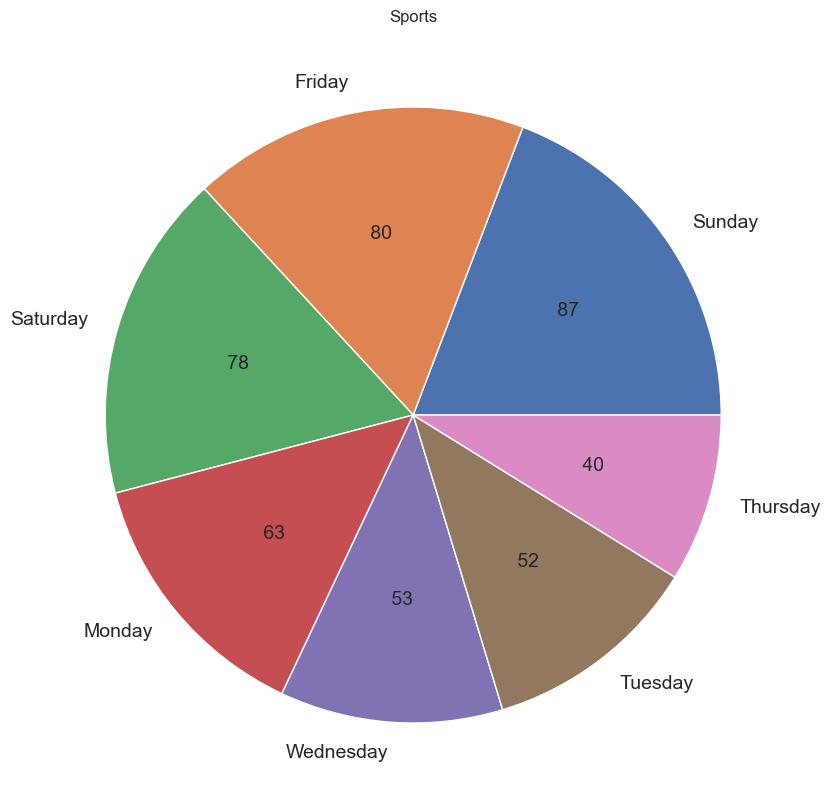

Category: Howto & Style


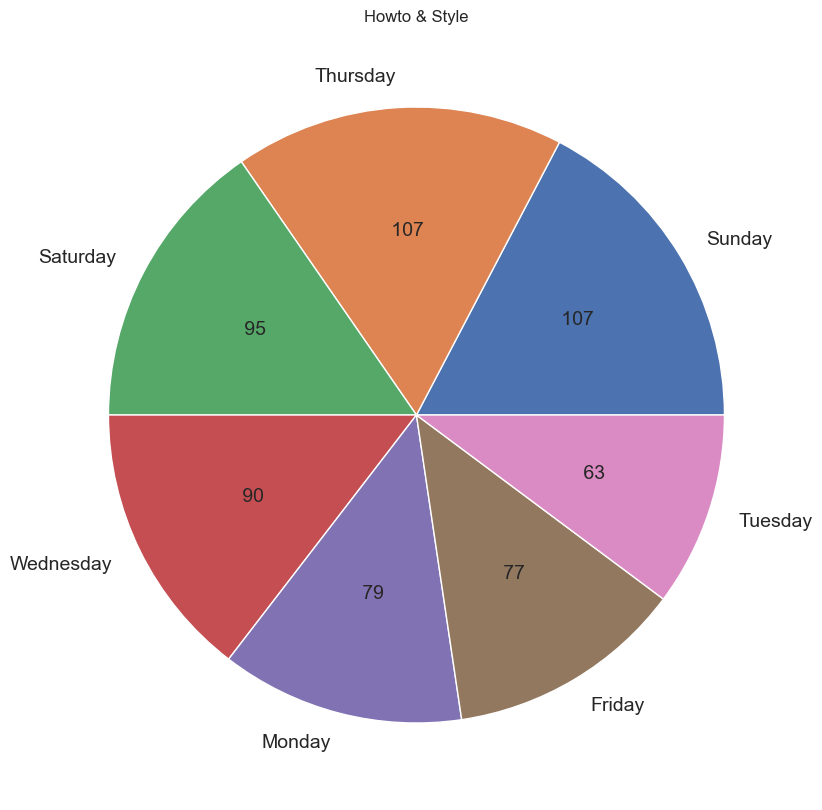

Category: Gaming


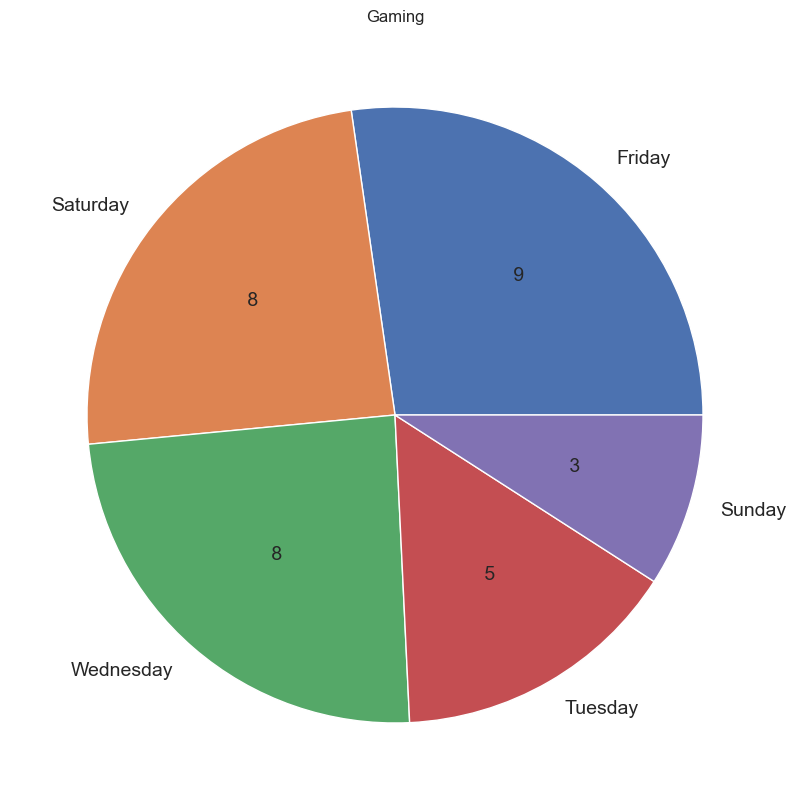

Category: Pets & Animals


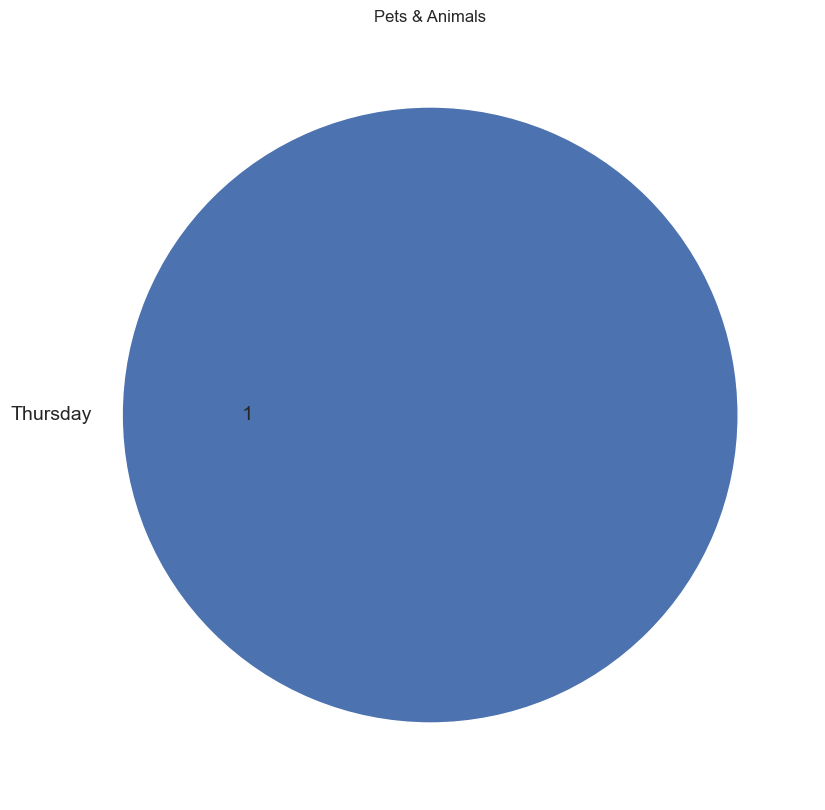

Category: Autos & Vehicles


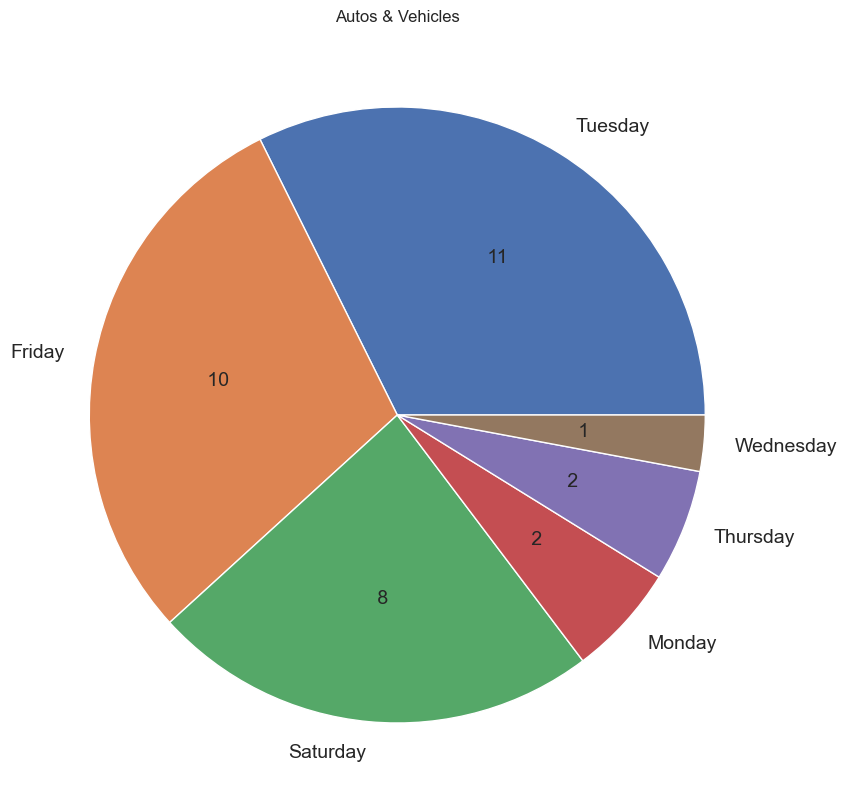

Category: Shows


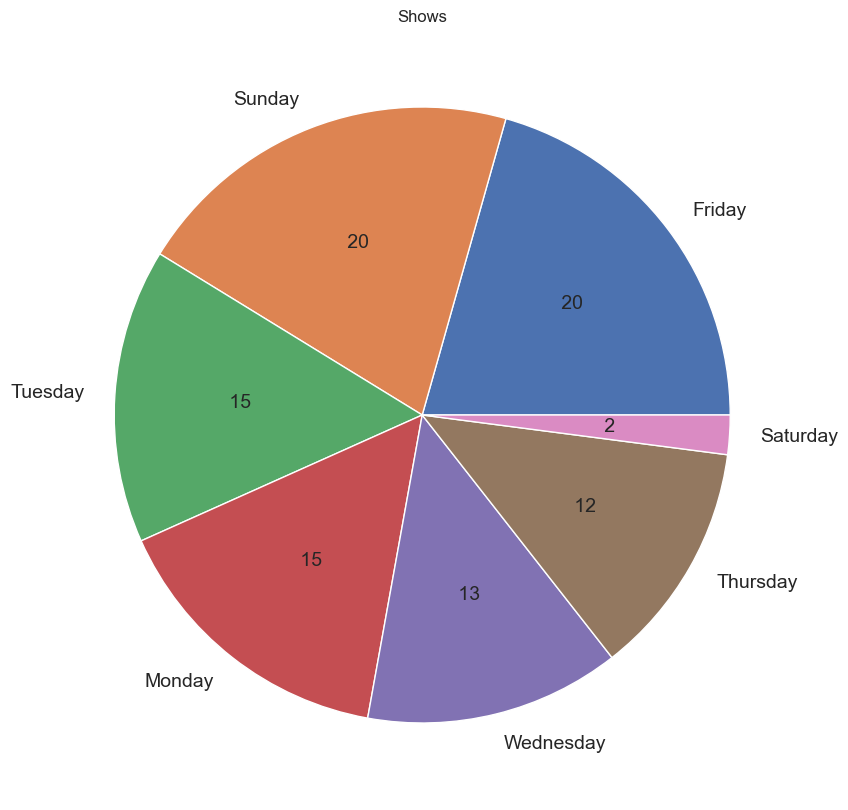

Category: Travel & Events


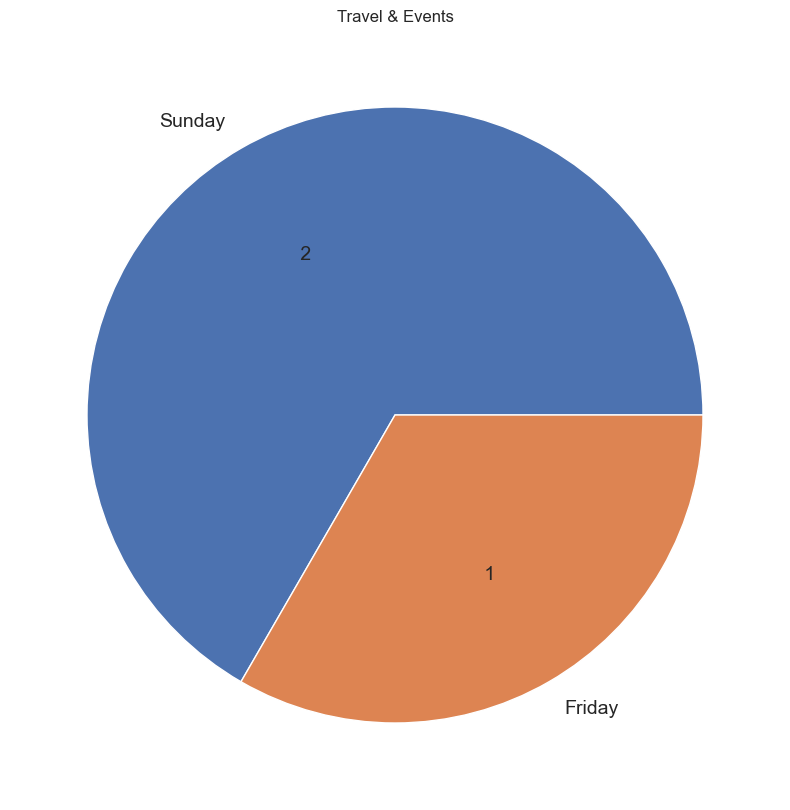

Category: Movies


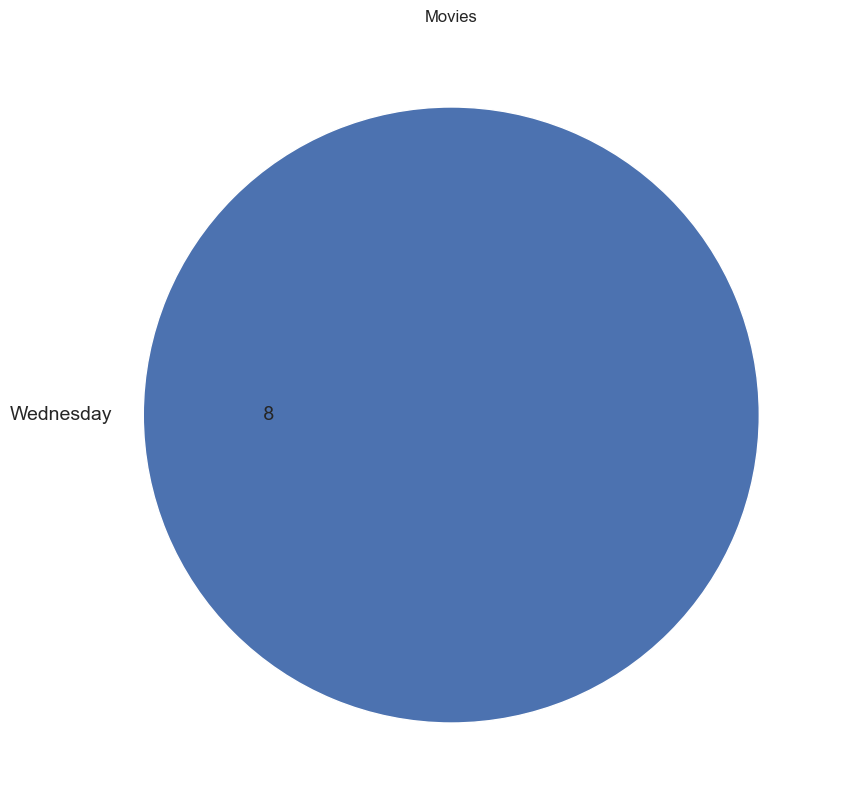

'\nThis code defines a function called `weekdayscategory` which takes two arguments: `data`, presumably a DataFrame, and `yr`, an integer representing a year. \nIt filters the DataFrame to get data for the specified year, then groups the data by category. \nFor each category, it counts the occurrences of each weekday when articles were published and prints the category name along with a pie chart showing the distribution of publishing weekdays for that category. \nHowever, there seems to be a missing definition for the `pie()` function, which would need to be defined elsewhere in the code or imported from a library.\n\n\n'

In [ ]:

def weekdayscategory(data,yr):
  data_c=data[data['publish_year']==yr]
  cat=data_c['category'].unique()
  for i in cat:
    catd = data_c[data_c['category']==i]
    x = catd['publish_weekday'].value_counts()
    print('Category:',i)
    pie(x,i)

weekdayscategory(df,2018)
'''
This code defines a function called `weekdayscategory` which takes two arguments: `data`, presumably a DataFrame, and `yr`, an integer representing a year. 
It filters the DataFrame to get data for the specified year, then groups the data by category. 
For each category, it counts the occurrences of each weekday when articles were published and prints the category name along with a pie chart showing the distribution of publishing weekdays for that category. 
However, there seems to be a missing definition for the `pie()` function, which would need to be defined elsewhere in the code or imported from a library.


'''

In [ ]:
df['dateInt']=df['publish_year'].astype(str) + df['publish_month'].astype(str)+ df['publish_day'].astype(str)
df['publis_d'] = pd.to_datetime(df['dateInt'], format='%Y%m%d')
df=df.drop(columns=['dateInt'],axis=1)
df['dateInt']=df['trend_year'].astype(str) + df['trend_month'].astype(str)+ df['trend_date'].astype(str)
df['trend_d'] = pd.to_datetime(df['dateInt'], format='%Y%m%d')
df=df.drop(columns=['dateInt'],axis=1)
df['diff_t'] = (df['trend_d'] - df['publis_d']).dt.days

data_2=df[df['publish_year']==2017]
data_3= df[df['publish_year']==2018]
data_4=pd.concat([data_2,data_3])
'''
This code creates two new date columns from existing columns representing the publication and trend dates, calculates the time difference between them, 
filters the DataFrame for articles published in 2017 and 2018, and combines the resulting DataFrames.


'''

'\nThis code creates two new date columns from existing columns representing the publication and trend dates, calculates the time difference between them, \nfilters the DataFrame for articles published in 2017 and 2018, and combines the resulting DataFrames.\n\n\n'

The median no of days is 2.0


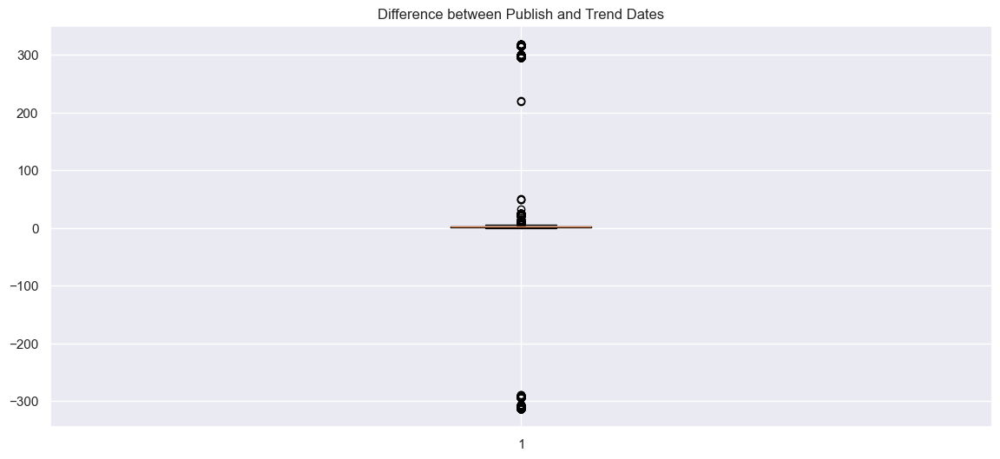

"\nThis block of code seems to create a boxplot to visualize the distribution of the 'diff_t' column from the 'data_4' DataFrame. \nIt calculates and prints the median number of days from the 'diff_t' column of another DataFrame named 'df'. Finally, it displays the boxplot along with its title.\n\n"

In [ ]:
cssset()
fig1, ax1 = plt.subplots()
ax1.set_title('Difference between Publish and Trend Dates')
ax1.boxplot(data_4['diff_t'])
print("The median no of days is",np.median(df['diff_t']))
plt.show()

'''
This block of code seems to create a boxplot to visualize the distribution of the 'diff_t' column from the 'data_4' DataFrame. 
It calculates and prints the median number of days from the 'diff_t' column of another DataFrame named 'df'. Finally, it displays the boxplot along with its title.

'''

#Analysis of cumulative data

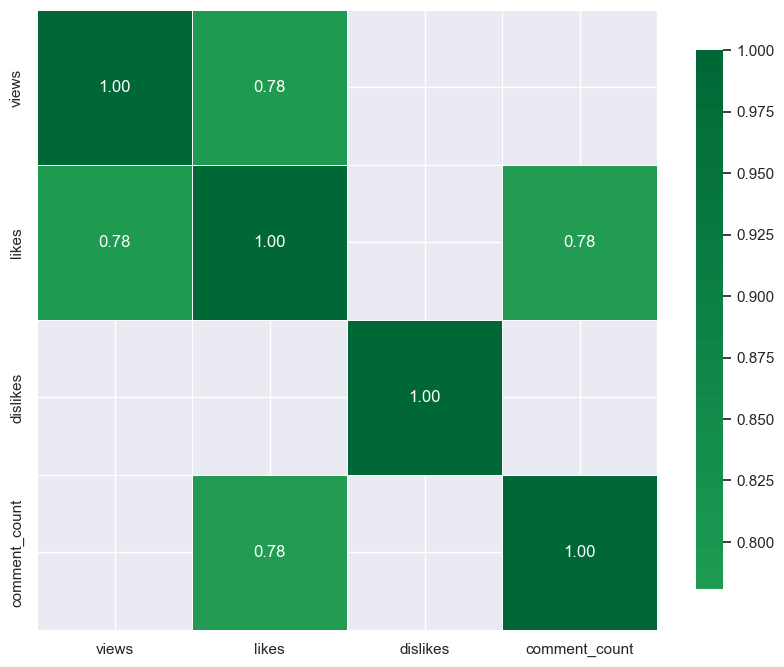

'\nThis code defines a function called `corrheatmap` that creates a heatmap to visualize correlations between views, likes, dislikes, and comment count in a dataset. \nIt selects these columns from the dataset, computes their correlations, filters out correlations above 0.75 or below -0.75, and then plots them using seaborn and matplotlib libraries.\n\n'

In [ ]:
cssset()
def corrheatmap(data):
    data2 = data[["views", "likes", "dislikes", "comment_count"]]
    correlations = data2.corr()
    correlations = correlations[((correlations >= 0.75) | (correlations <= -0.75))]
    fig, ax = plt.subplots(figsize=(10,10))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f', square=True, linewidths=.5, annot=True,cmap='RdYlGn', cbar_kws={"shrink": .70})
    plt.show();  
corrheatmap(tdf)
'''
This code defines a function called `corrheatmap` that creates a heatmap to visualize correlations between views, likes, dislikes, and comment count in a dataset. 
It selects these columns from the dataset, computes their correlations, filters out correlations above 0.75 or below -0.75, and then plots them using seaborn and matplotlib libraries.

'''

region
CA    41079
DE    41039
FR    40924
GB    38942
IN    32847
US    40899


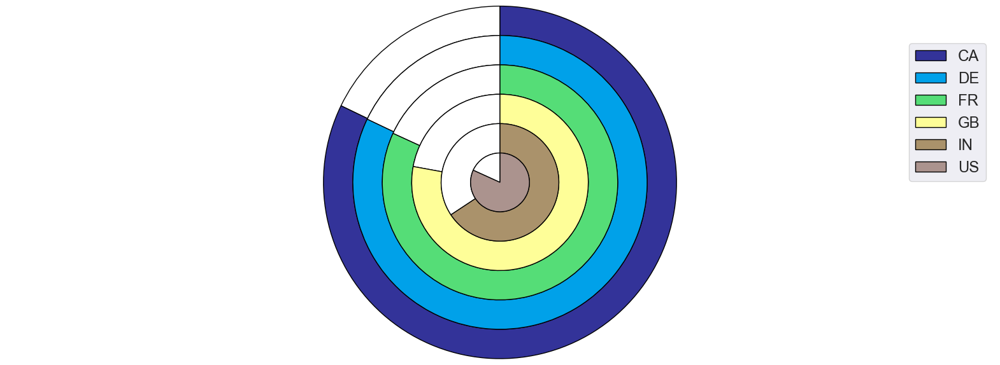

'\nThis code generates a pie chart visualization using Matplotlib in Python. \nIt takes data from a DataFrame grouped by regions, calculates the count of titles in each region, and then plots a pie chart where each slice represents a region. \nThe size of each slice is proportional to the count of titles in that region. The pie chart is customized with colors, labels, and legend to make it more informative and visually appealing.\n'

In [ ]:
cssset()
labels = countries
data = tdf.groupby(['region']).count()['title'].sort_index()
n = len(data)
k = 10 ** int(log10(max(data)))
m = k * (1 + max(data) // k)
r = 1.5
w = r / n 
colors = [cm.terrain((i) / n) for i in range(n)]
fig, ax = plt.subplots()
fig.set_size_inches(20,6)
ax.axis("equal")
for i in range(n):
    innerring, _ = ax.pie([m - data[i], data[i]], radius = r - i * w, startangle = 90 , labels = ["", labels[i]], labeldistance = 1 - 1 / (1.5 * (n)), textprops = {"alpha": 0}, colors = ["white", colors[i]])
    plt.setp(innerring, width = w, edgecolor = "black")
print(data.to_string())
plt.legend(loc=1,fontsize='x-large')
plt.show()
'''
This code generates a pie chart visualization using Matplotlib in Python. 
It takes data from a DataFrame grouped by regions, calculates the count of titles in each region, and then plots a pie chart where each slice represents a region. 
The size of each slice is proportional to the count of titles in that region. The pie chart is customized with colors, labels, and legend to make it more informative and visually appealing.
'''

In [ ]:
# cssset()
# def plot_choropleth(a):
#   datav = dict(
#         type = 'choropleth',
#         colorscale = 'Viridis',
#         locations = ['Canada','Denmark','France','United Kingdom','India','United States'],
#         locationmode = "country names",
#         z = tdf.groupby(by=['region'])[a].sum(),
#         text = countries,
#         colorbar = {'title' : "No of "+ f'{a}'},
#       )
#   layout = dict(width =900,
#                 height = 650,
#               title = '------Geo-Map representing stats of the 6 countries----',
#               geo = dict(projection = {'type':'mercator'})
#              )
#   choromap = go.Figure(data = [datav],layout = layout)
#   display(HTML(plot(choromap,validate=False)))
# def main_choropleth():
#   a  = str(input("Enter the stat in words\n"))
#   plot_choropleth(a.lower())
# main_choropleth()

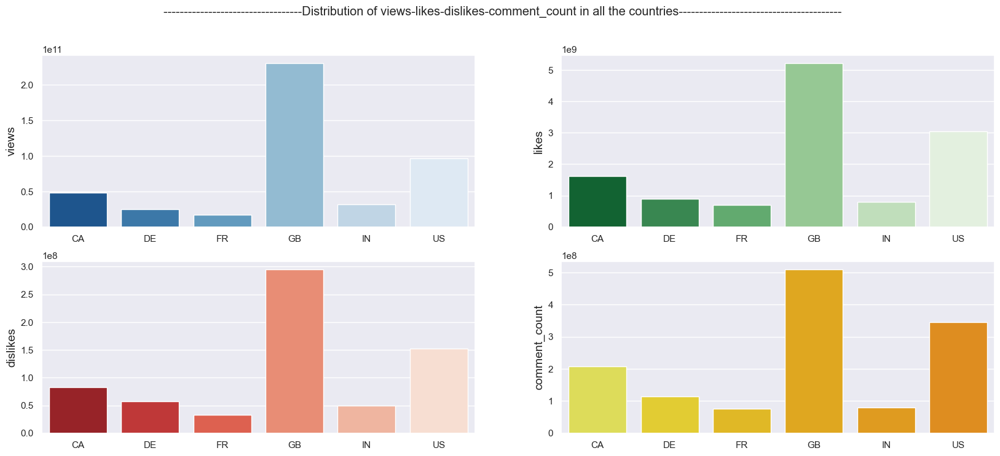

'\nThis code defines a function called `distoveralll` that creates a 2x2 grid of bar plots showing the distribution of views, likes, dislikes, and comment counts across different regions or countries. \nIt uses seaborn (sns) for plotting and matplotlib (plt) for managing the overall figure. \nThe function iterates through each subplot, plotting the aggregated sum of each metric (views, likes, dislikes, comment_count) for each region or country. \nFinally, it displays the plots with a title.\n'

In [ ]:
def distoveralll():
    f, axes = plt.subplots(2, 2)
    f.set_size_inches(20, 8)
    f.suptitle("----------------------------------Distribution of views-likes-dislikes-comment_count in all the countries----------------------------------------")
    color = ['Blues_r', 'Greens_r', 'Reds_r', 'Wistia']
    count = 0
    s = ['views', 'likes', 'dislikes', 'comment_count']
    for row in range(2):
        for col in range(2):
            a = s[count]
            sns.barplot(x=countries, y=tdf.groupby(by=['region'])[a].sum(), palette=color[count], ax=axes[row, col])
            axes[row, col].set_ylabel(a, fontsize=14)
            count += 1
    plt.show()

distoveralll()
'''
This code defines a function called `distoveralll` that creates a 2x2 grid of bar plots showing the distribution of views, likes, dislikes, and comment counts across different regions or countries. 
It uses seaborn (sns) for plotting and matplotlib (plt) for managing the overall figure. 
The function iterates through each subplot, plotting the aggregated sum of each metric (views, likes, dislikes, comment_count) for each region or country. 
Finally, it displays the plots with a title.
'''

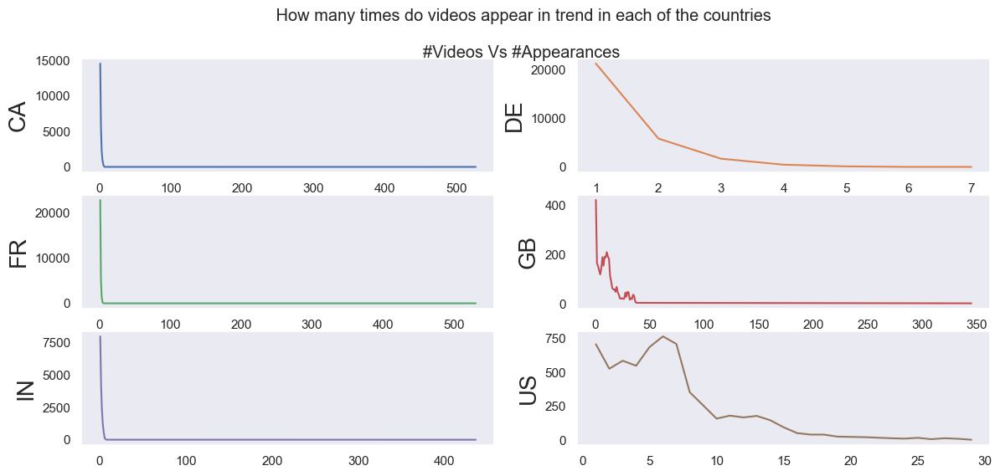

'\nThis code defines a function `appearalltrend()` which generates a subplot grid visualizing the trend of video appearances in different regions. \nIt first organizes data on video appearances in each region, then plots this data for each country in a subplot. \nThe resulting visualization displays the number of times videos appear in trends across various countries.\n\n'

In [ ]:
def appearalltrend():
    video_list = []
    x = pd.DataFrame(tdf.groupby(['video_id', 'region']).count()['title'].sort_values(ascending=False)).reset_index()[1:]
    x.index = x.video_id
    for c in countries:
        video_list.append(x[x['region'] == c]['title'].value_counts().sort_index())

    f, ax = plt.subplots(nrows=3, ncols=2)
    f.suptitle(" How many times do videos appear in trend in each of the countries\n\n#Videos Vs #Appearances")
    my_colors = plt.rcParams['axes.prop_cycle']()

    i = 0
    for row in range(3):
        for col in range(2):
            if i < len(video_list):  # Check if i is within the range of video_list
                ax[row, col].plot(video_list[i].index, video_list[i], **next(my_colors))
                ax[row, col].set_ylabel(countries[i], fontsize=20)
                ax[row, col].grid(False)
                i += 1
            else:
                break  # Exit the loop if i exceeds the length of video_list

    plt.show()

appearalltrend()
'''
This code defines a function `appearalltrend()` which generates a subplot grid visualizing the trend of video appearances in different regions. 
It first organizes data on video appearances in each region, then plots this data for each country in a subplot. 
The resulting visualization displays the number of times videos appear in trends across various countries.

'''

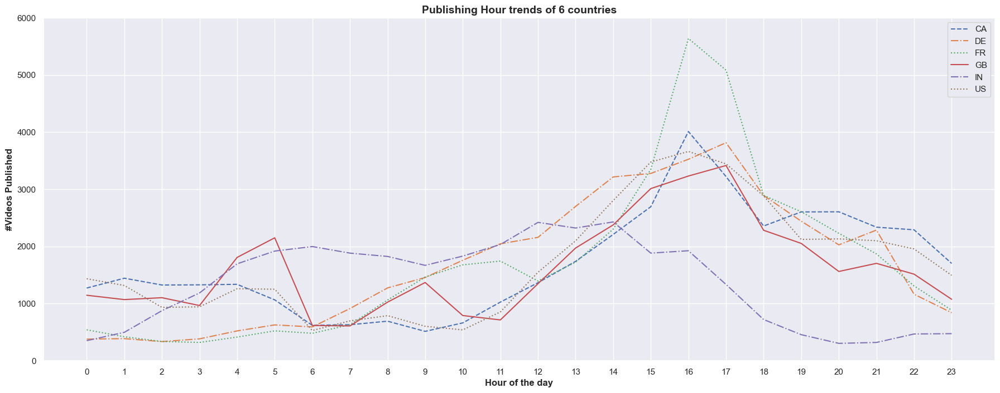

In [ ]:
cssset()
def allpublishhours():
  a = pd.DataFrame(tdf.groupby(tdf['region'],as_index=True).publish_hour.value_counts())
  a.columns = ['hour']
  a = a.reset_index()
  linestyle = ['--', '-.', ':','solid','dashdot', 'dotted']
  it = iter(linestyle)
  for i in a.region.unique():
    x = a[a['region']==i].sort_values(['publish_hour']).reset_index()
    sns.set(font_scale=1.5)
    sns.set(style="whitegrid")
    sns.set(rc={'figure.figsize':(22,8)})
    plt.plot(x.hour,linestyle=next(it))
  plt.legend(a.region.unique())
  plt.xticks(np.arange(0, 24, 1))
  plt.yticks(np.arange(0, 7000, 1000))
  plt.title("Publishing Hour trends of 6 countries",fontsize=14,weight='bold')
  plt.xlabel("Hour of the day",weight="bold")
  plt.ylabel("#Videos Published",weight="bold")
allpublishhours()

In [ ]:
def maxpublishday():
    # Calculate the count of each weekday and sort by index
    countweekdays = tdf['publish_weekday'].value_counts().sort_index()
    
    # Create a DataFrame to use in the scatter plot
    data = {'Weekday': ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'],
            'Frequency': countweekdays.values}
    df = pd.DataFrame(data)
    
    # Create the scatter plot using Plotly Express
    fig = px.scatter(df, 
                     title='Which day of the week do creators prefer to publish?',
                     x='Weekday', 
                     y='Frequency',
                     color='Frequency',  # Set color based on frequency
                     size='Frequency',   # Set size based on frequency
                     labels={'Frequency': 'Frequency', 'Weekday': 'Day of the Week'},  # Customize axis labels
                     hover_name='Weekday',  # Specify hover information
                     color_continuous_scale='viridis')  # Choose color scale
    
    # Display the plot
    display(HTML(fig.to_html()))

maxpublishday()
'''
This code block creates a scatter plot using Plotly Express to visualize the frequency of publishing on each day of the week by content creators. 
It first calculates the count of publishing occurrences for each weekday, then creates a DataFrame for plotting. 
The scatter plot displays each weekday on the x-axis and the frequency of publishing on the y-axis. 
The size and color of the points represent the frequency, with larger and more colorful points indicating higher frequency. 
Finally, it displays the plot.

'''

'\nThis code block creates a scatter plot using Plotly Express to visualize the frequency of publishing on each day of the week by content creators. \nIt first calculates the count of publishing occurrences for each weekday, then creates a DataFrame for plotting. \nThe scatter plot displays each weekday on the x-axis and the frequency of publishing on the y-axis. \nThe size and color of the points represent the frequency, with larger and more colorful points indicating higher frequency. \nFinally, it displays the plot.\n\n'

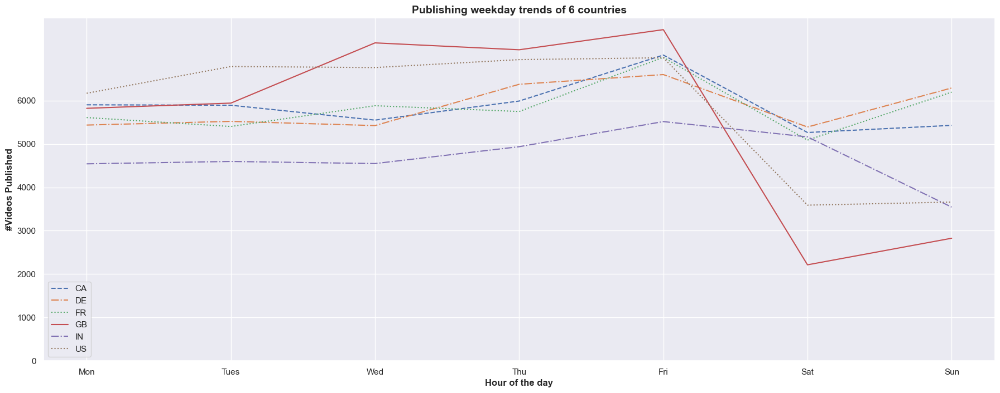

In [ ]:
cssset()
def allpublishhours():
  a = pd.DataFrame(tdf.groupby(tdf['region'],as_index=True).publish_weekday.value_counts())
  a.columns = ['weekday']
  a = a.reset_index()
  linestyle = ['--', '-.', ':','solid','dashdot', 'dotted']
  it = iter(linestyle)
  labels = ['Mon','Tues','Wed','Thu','Fri','Sat','Sun']
  for i in a.region.unique():
    x = a[a['region']==i].sort_values(['publish_weekday']).reset_index()
    sns.set(font_scale=1.5)
    sns.set(style="whitegrid")
    sns.set(rc={'figure.figsize':(22,8)})
    plt.plot(x.weekday,linestyle=next(it))
  plt.legend(a.region.unique())
  plt.xticks(range(len(labels)),labels)
  plt.yticks(np.arange(0, 7000, 1000))
  plt.title("Publishing weekday trends of 6 countries",fontsize=14,weight='bold')
  plt.xlabel("Hour of the day",weight="bold")
  plt.ylabel("#Videos Published",weight="bold")
allpublishhours()

In [ ]:
def maxviewdays():
  fig = px.scatter(tdf,
                  title='Which day of the week has the highest viewership ?',
                  x =np.array(['Mon','Tues','Wed','Thu','Fri','Sat','Sun']),
                  y = tdf.groupby(by=['publish_weekday']).views.sum(),
                  color=tdf.groupby(by=['publish_weekday']).views.sum(),
                  size=tdf.groupby(by=['publish_weekday']).views.sum(),
                  
                  ) 
  fig.update_layout(xaxis={'title': 'Day of the week'}, yaxis_title = 'No of views')
  display(HTML(pyoff.plot(fig)))
maxviewdays()
'''
This code defines a function called `maxviewdays()`, which visualizes the total viewership of each day of the week using a scatter plot. 
It uses Plotly Express (`px`) to create the plot, with days of the week on the x-axis and total views on the y-axis. Th
e size and color of the points represent the total views as well. Finally, it displays the plot using the `display()` function.
'''

'\nThis code defines a function called `maxviewdays()`, which visualizes the total viewership of each day of the week using a scatter plot. \nIt uses Plotly Express (`px`) to create the plot, with days of the week on the x-axis and total views on the y-axis. Th\ne size and color of the points represent the total views as well. Finally, it displays the plot using the `display()` function.\n'

In [ ]:
def maxviewmonths():
  a = pd.DataFrame(tdf.groupby(tdf['region'],as_index=True).publish_month.value_counts().sort_index())
  a.columns = ['count']
  a = a.reset_index()
  a['month'] = str(0)
  for index,i in enumerate(a.publish_month):
    a.at[index,'month'] = str(months_choices[i])

  fig = px.scatter(a,
                  title='Which month has most videos published?',
                  x = a['month'],
                  y = a['count'],
                  color=a['count'],
                  size=a['count'],
                  hover_data = ['region']
                  ) 
  fig.update_layout(xaxis={'title': 'Month'}, yaxis_title = 'No of videos')
  display(HTML(pyoff.plot(fig)))
maxviewmonths()
'''
This code defines a function called `maxviewmonths` that visualizes the month with the most published videos for each region in a dataset. 
It first groups the data by region and month, then creates a scatter plot using Plotly Express (`px.scatter`). 
The size and color of the dots represent the count of videos published. Finally, it displays the plot using HTML display.

'''

'\nThis code defines a function called `maxviewmonths` that visualizes the month with the most published videos for each region in a dataset. \nIt first groups the data by region and month, then creates a scatter plot using Plotly Express (`px.scatter`). \nThe size and color of the dots represent the count of videos published. Finally, it displays the plot using HTML display.\n\n'

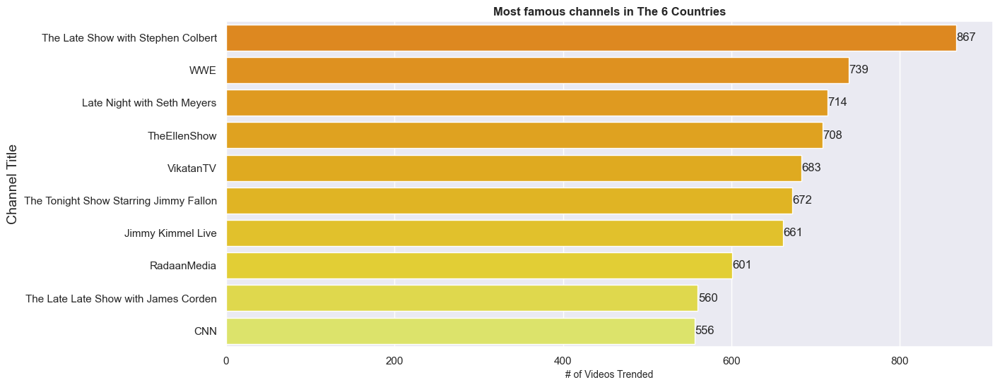

In [ ]:
cssset()
trenvidschnls(tdf)

-------------- Science & Technology ----------------
channel_title
Marques Brownlee      313
CrazyRussianHacker    263
Linus Tech Tips       254
Dr Nozman             229
AsapSCIENCE           221


-------------- Gaming ----------------
channel_title
Nintendo              203
The Game Theorists    156
Cow Chop              139
videogamedunkey       132
GameGrumps            114


-------------- Comedy ----------------
channel_title
Late Night with Seth Meyers               714
The Tonight Show Starring Jimmy Fallon    672
CollegeHumor                              405
The Daily Show with Trevor Noah           337
jacksfilms                                291


-------------- Entertainment ----------------
channel_title
The Late Show with Stephen Colbert    755
TheEllenShow                          708
RadaanMedia                           601
Netflix                               532
FBE                                   490




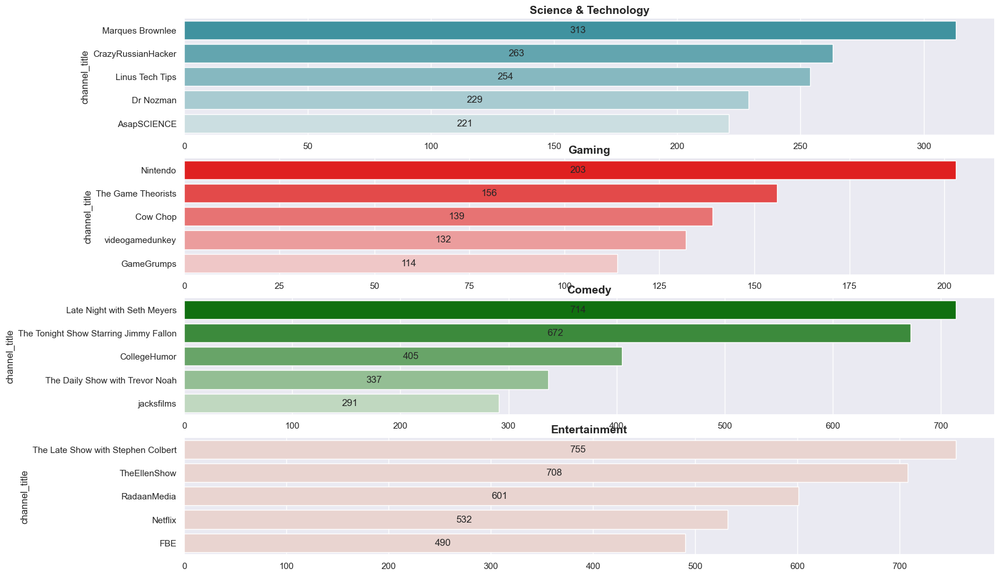

In [ ]:
cssset()
chnltopcat(tdf,'Science & Technology','Gaming','Comedy','Entertainment')

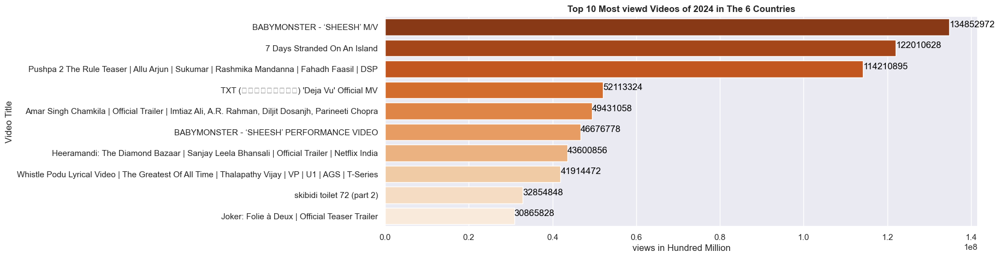

In [ ]:
cssset()
mostlyyearvideos(tdf)

                       0
0                  Music
1          Entertainment
2       Film & Animation
3        News & Politics
4                 Sports
5   Science & Technology
6         People & Blogs
7                 Comedy
8              Education
9                  Shows
10         Howto & Style
11                Gaming
12        Pets & Animals
13      Autos & Vehicles
14       Travel & Events
15                Movies


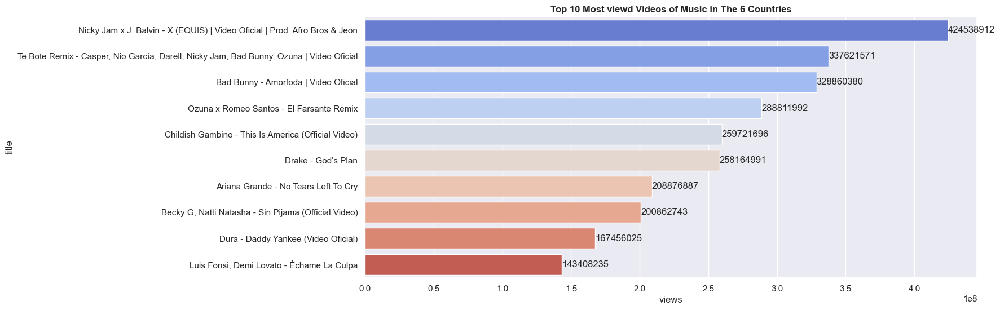

In [ ]:
catmost(tdf)

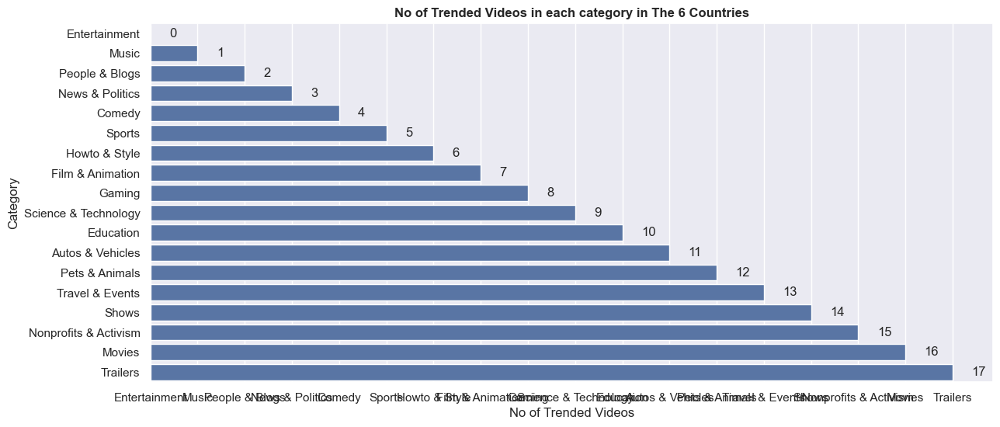

In [ ]:
cssset()
famcatmost(tdf)

#Sentiment and Text Analysis

In [ ]:
sa = tdf[tdf.region!="IN"]

'\nThis code calculates the sentiment polarity of different categories of YouTube videos based on their tags. \nIt starts by setting up some CSS styles, defining a maximum number of words to consider, and creating a list of stopwords (common words to ignore). \nThen, it iterates through each category, extracts tags associated with videos in that category, cleans and processes the tags data, calculates sentiment polarity scores for each word, sums them up for each category, and stores the results. \nFinally, it visualizes the polarity of each category using a horizontal bar plot.\n\n'

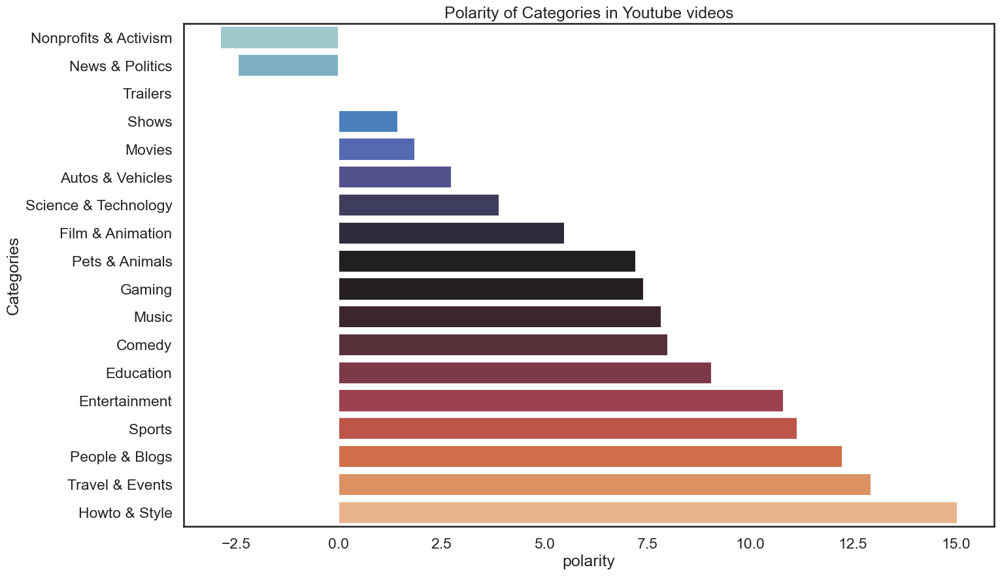

In [ ]:
cssset()
MAX_N = 1000

stopwordsen = list(stopwords.words('english'))
stopwordsde = list(stopwords.words('german'))   
stopwordsfr = list(stopwords.words('french'))   
stopwordsen.extend(stopwordsde)
stopwordsen.extend(stopwordsfr)

pollarities = list()
listofcategorise = list(sa.category.unique())
for cate in listofcategorise:
    wordtagss = sa[sa['category']==cate]['tags'].str.lower().str.cat(sep=' ')

    wordtagss = re.sub('[^A-Za-z]+', ' ', wordtagss)
    tokenwords = word_tokenize(wordtagss)
    sentencefiltered = [w for w in tokenwords if not w in stopwordsen]

    singlechrwithout = [word for word in sentencefiltered if len(word) > 2]

    cleanedatatitle = [word for word in singlechrwithout if not word.isdigit()]      

    disttword = nltk.FreqDist(cleanedatatitle)
    hnhk = pd.DataFrame(disttword.most_common(MAX_N),
                    columns=['Word', 'Frequency'])

    compound = .0
    for word in hnhk['Word'].head(MAX_N):
        compound += SentimentIntensityAnalyzer().polarity_scores(word)['compound']

    pollarities.append(compound)

listofcategorise = pd.DataFrame(listofcategorise)
pollarities = pd.DataFrame(pollarities)
sentimenttags = pd.concat([listofcategorise,pollarities],axis=1)
sentimenttags.columns = ['category','polarity']
sentimenttags=sentimenttags.sort_values('polarity').reset_index()

plt.figure(figsize=(16,10))
sns.set(style="white",context="talk")
ax = sns.barplot(x=sentimenttags['polarity'],y=sentimenttags['category'], data=sentimenttags,orient='h',palette="icefire")
plt.ylabel("Categories")
plt.xlabel("polarity")
plt.title("Polarity of Categories in Youtube videos")

'''
This code calculates the sentiment polarity of different categories of YouTube videos based on their tags. 
It starts by setting up some CSS styles, defining a maximum number of words to consider, and creating a list of stopwords (common words to ignore). 
Then, it iterates through each category, extracts tags associated with videos in that category, cleans and processes the tags data, calculates sentiment polarity scores for each word, sums them up for each category, and stores the results. 
Finally, it visualizes the polarity of each category using a horizontal bar plot.

'''

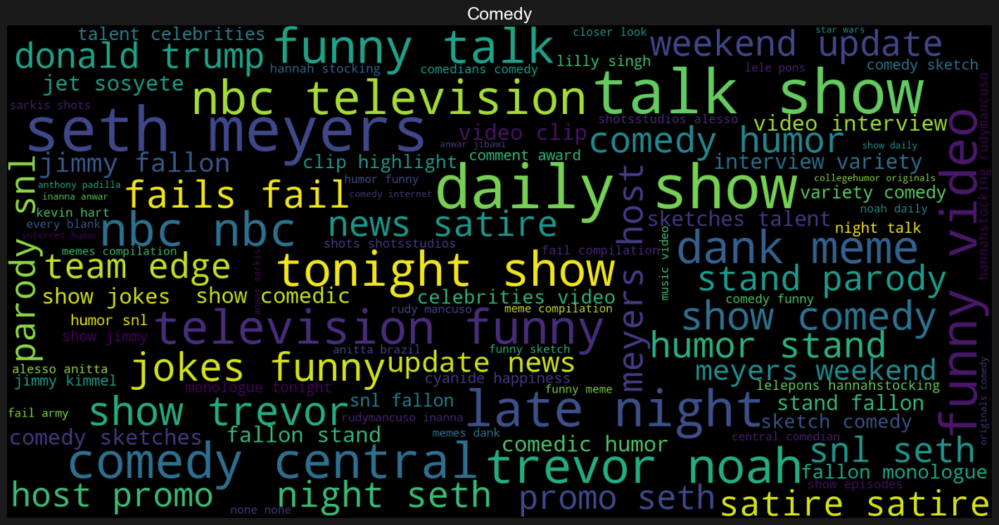

In [ ]:
cssset()
def wcloud(categ,data):
    
    wordtagss = sa[sa['category']==categ]['tags'].str.lower().str.cat(sep=' ')
    wordtagss = re.sub('[^A-Za-z]+', ' ', wordtagss)
    tokenwords = word_tokenize(wordtagss)
    sentencefiltered = [w for w in tokenwords if not w in stopwordsen]
    singlechrwithout = [word for word in sentencefiltered if len(word) > 2]
    cleanedatatitle = [word for word in singlechrwithout if not word.isdigit()]
    cloud = WordCloud(width=1600,height=800, max_words = 100,  max_font_size = 100)
    cloud.generate(' '.join(cleanedatatitle))
    plt.figure(figsize = (20,7),facecolor='k')
    plt.imshow(cloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.title(categ,color='white',fontsize=18)

wcloud('Comedy',sa) 

In [ ]:
!pip install textblob


[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
from textblob import TextBlob


listblobltitle = list()

titlestsa = sa['title']
for row in titlestsa:
    blob = TextBlob(row)
    listblobltitle.append((row, blob.sentiment.polarity, blob.sentiment.subjectivity))
    
sapolartitle = pd.DataFrame(listblobltitle, columns=['sentence', 'sentiment', 'polarity'])

def f_title(sapolartitle):
    if sapolartitle['sentiment'] > 0:
        val = "Positive"
    elif sapolartitle['sentiment'] == 0:
        val = "Neutral"
    else:
        val = "Negative"
    return val

sapolartitle['Sentiment_Type'] = sapolartitle.apply(f_title, axis=1)
sapolartitle.to_csv('SA.csv')
'''
This block of code analyzes the sentiment of text data in a DataFrame column ('titlestsa') using TextBlob, which measures polarity and subjectivity. 
It then categorizes the sentiment as Positive, Neutral, or Negative and stores the results in a new DataFrame ('sapolartitle'), which is saved to a CSV file ('SA.csv').

'''

"\nThis block of code analyzes the sentiment of text data in a DataFrame column ('titlestsa') using TextBlob, which measures polarity and subjectivity. \nIt then categorizes the sentiment as Positive, Neutral, or Negative and stores the results in a new DataFrame ('sapolartitle'), which is saved to a CSV file ('SA.csv').\n\n"

'\nThis block of code reads sentiment analysis data from a CSV file, creates a bar plot showing the count of different sentiment types, and adds value labels on top of each bar. \nFinally, it sets the title of the plot to "pollarities".\n'

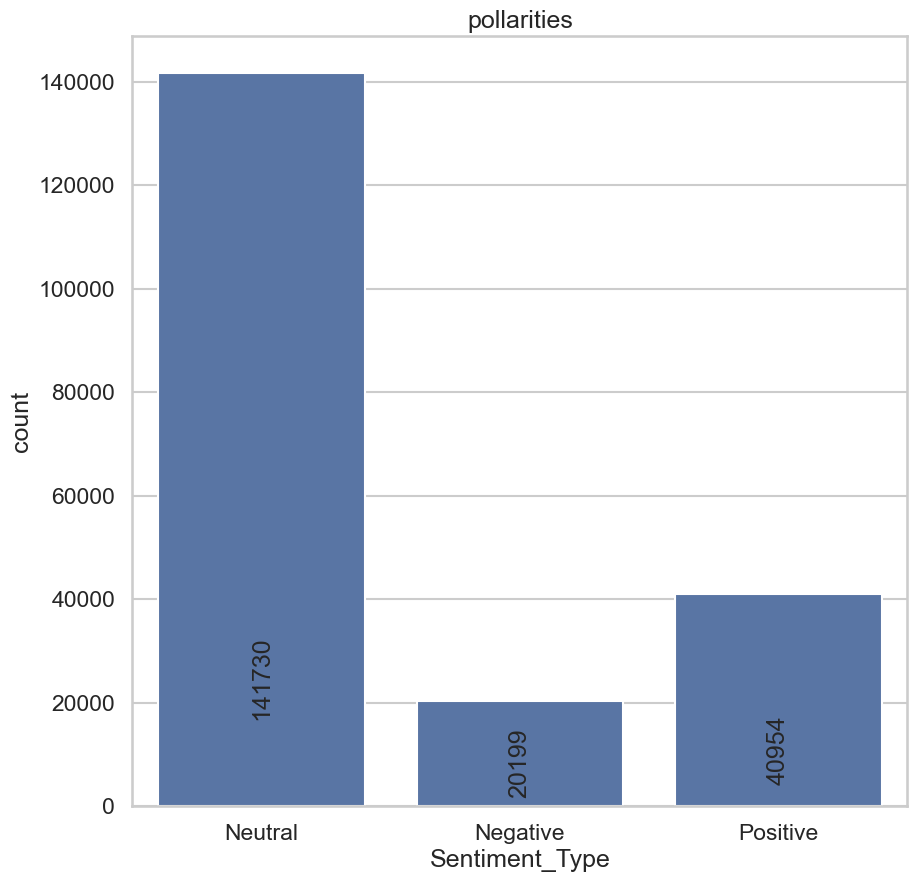

In [ ]:
cssset()
sapolartitle = pd.read_csv('SA.csv')
plt.figure(figsize=(10,10))
sns.set_style("whitegrid")
ax = sns.countplot(x="Sentiment_Type", data=sapolartitle)
show_values_on_bars(ax,'v')
plt.title("pollarities")
'''
This block of code reads sentiment analysis data from a CSV file, creates a bar plot showing the count of different sentiment types, and adds value labels on top of each bar. 
Finally, it sets the title of the plot to "pollarities".
'''